#  Analysis of 2-photon imaging and behavioral data

Accompanying publication of \
**Overlapping representations of food and social stimuli in VTA dopamine neurons** \
Lindsay Willmore, Adelaide Minerva, Ben Engelhard, Brenna McMannon, Nirja Oak, Stephan Thiberge, Malavika Murugan, Catherine Jensen Pena, Ilana Witten

In [162]:
# Import modules
from collections import Counter
import glob
from importlib import reload
from itertools import combinations
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import pandas as pd
import scipy
from scipy import signal
from scipy import stats
from scipy.io import loadmat
import scipy.io.wavfile as wavfile
from scipy.signal import medfilt
from scipy.signal import detrend
from scipy.stats import linregress, pearsonr, sem, ttest_1samp, ttest_ind, ttest_rel
import seaborn as sns
from skimage import exposure
from skimage.morphology import dilation
from skimage.segmentation import find_boundaries
from sklearn.linear_model import TheilSenRegressor
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.proportion import proportions_ztest,test_proportions_2indep


# Custom tools.
import tools_ROIs

%matplotlib inline

In [2]:
# Imports for formatting image output.
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
from matplotlib.font_manager import findfont, FontProperties
plt.rcParams['font.sans-serif']

['DejaVu Sans',
 'Bitstream Vera Sans',
 'Computer Modern Sans Serif',
 'Lucida Grande',
 'Verdana',
 'Geneva',
 'Lucid',
 'Arial',
 'Helvetica',
 'Avant Garde',
 'sans-serif']

In [197]:
# Color palette.
gc_cols = {'sated':"#088096", 'hungry':"#7AD4E4"} 
mf_cols = ["#514289", "#C4878C"]
kcols={
    'brown':"#A77652", 
    'gold':"#F2C27B",
    'blue':"#AAC9ED",
    'grey':"#8E949F"
}
cond2color = {
    'preHabituation':'grey',
    'baseline':'royalblue',
    'hungry': "#7AD4E4",
    'sated':"#088096",
    'sexualExperience':'tab:red'
}

In [4]:
from scipy import ndimage, misc
from scipy.signal import butter,filtfilt

def butter_lowpass(cutoff, fs=30, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs=1017, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y

def butter_highpass(cutoff, fs=30, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs=30, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


def get_peaks(raw_signal,fs=30):
    sig2 = butter_lowpass_filter(raw_signal,3,fs,order=1)
    sig3= butter_highpass_filter(sig2,0.01,fs,order=1)
    hp = butter_highpass_filter(raw_signal,3,fs,order=3)
    limit = np.max([ndimage.maximum_filter(-hp,fs)*1.,ndimage.maximum_filter(sig3/np.std(hp),11)],axis=0)
    peaks = np.where(np.logical_and(sig3/np.std(hp)>=limit,sig3/np.std(hp)>2.5))[0]
    return peaks

def get_dff(F,neu,scaling=0.58,window=60*10,percentile=8,fs=30):
    raw=F-neu*scaling
    raw-=raw.min()
    filtered=detrend((raw-raw.mean())/raw.mean())
    return filtered 

## Load data
These data were extracted via Suite2P and aligned to syncing signals for alignment with stimulus delivery and behavior.

Data format \
'mouse': identify for individual mice, \
'day': day of the experiment (weekXdayY), \
'date': date of experiment, \
'condition': condition of animal during experiment (e.g. hungry), \
'stimuli': , \
'galvo_times':galvo_times, \
'camera_times':cam_times, \
'trial_starts':trial_starts, \
'trial_ends':trial_ends, \
'puff_times':puff_times, \
'neuron_F':spks, \
'neuropil_F':neuropil, \
'cell_ids':cells

In [192]:
FIELDS = ['mouse', 'day', 'date',
          'condition', 'stimuli', 'galvo_times',
          'camera_times','trial_starts', 'trial_ends',
          'puff_times','neuron_F', 'neuropil_F',
          'cell_ids']
F2I = {f:i for i,f in enumerate(FIELDS)}  # Field name to indes in data matrix.
STIMULI=['male     ','female_E ', 'female_NE',  'food     ',  'object   ']
SOCIAL_STIMULI = ['male     ', 'female_E ', 'female_NE']
CONDITIONS = ['initial', 'baseline', 'sated', 'hungry',
            'sexualExperience', 'sexualExperience_hungry', 'sexualExperience_sated']
ALL_DAYS = ['w0e1', 'w1e1', 'w1e2', 'w1e3', 'w2e1', 'w2e2', 'w2e3']
A_THRESH=1.5  # Activity threshold.
PIXELS_PER_MM = 13.4

In [6]:
# Subject properties.
mouse2sex={'304':'F',
 '305':'F',
 '307':'M',
 '309':'M',
 '318':'F',
 '344':'M',
 '345':'M',
 '346':'M',
 '350':'F',
 '352':'F',
 '716':'M',
 '771':'M',
 '773':'M',
 '775':'F',
 '775n':'M',
 '776':'M',
 '778':'F',
 '779':'F',
 '788':'M',
 '791':'F' 
}
cohort1=['716','771','775','791','788']

In [7]:
enter_s=20*30
enter_e=23*30
stim_s=23*30
stim_e=43*30
exit_s=43*30
exit_e=56*30
time_frames={'before':(0,enter_s),
            'entry':(enter_s,enter_e),
            'stimulus':(stim_s,stim_e),
            'exit':(exit_s,exit_e),
            'after':(exit_e,-1)}

In [8]:
d1=loadmat('sessions_0_55.mat')['data'][0]
d2=loadmat('sessions_57_77.mat')['data'][0]
d3=loadmat('sessions_78_109.mat')['data'][0]
d4=loadmat('sessions_716_w1e1.mat')['data'][0]
d5=loadmat('sessions_352_w1e1.mat')['data'][0]
d6=loadmat('sessions_w0e1.mat')['data'][0]

In [9]:
d_all={}
for d_ in list(d1)+list(d2)+list(d3)+[d4]+[d5]+list(d6):
    d=d_[0][0]
    if len(d)==1 or len(d[F2I['neuron_F']][0])<80000:
        continue
    d_all[(d[0][0],d[1][0])]=d
    print(d[0],d[1][0])

['304'] w1e1
['304'] w1e2
['304'] w1e3
['304'] w2e1
['304'] w2e2
['304'] w2e3
['305'] w1e1
['305'] w1e2
['305'] w1e3
['305'] w2e1
['305'] w2e2
['305'] w2e3
['307'] w1e1
['307'] w1e2
['307'] w1e3
['307'] w2e1
['307'] w2e2
['307'] w2e3
['309'] w1e1
['309'] w1e2
['309'] w1e3
['309'] w2e1
['309'] w2e2
['309'] w2e3
['318'] w1e1
['318'] w1e2
['318'] w1e3
['318'] w2e1
['318'] w2e2
['318'] w2e3
['344'] w1e1
['344'] w1e2
['344'] w1e3
['344'] w2e1
['344'] w2e2
['344'] w2e3
['345'] w1e1
['345'] w1e2
['345'] w1e3
['345'] w2e1
['345'] w2e2
['345'] w2e3
['346'] w1e1
['346'] w1e2
['346'] w1e3
['346'] w2e1
['346'] w2e2
['346'] w2e3
['350'] w1e1
['350'] w1e2
['350'] w1e3
['350'] w2e1
['350'] w2e2
['350'] w2e3
['352'] w1e1
['352'] w1e2
['352'] w2e1
['352'] w2e2
['352'] w2e3
['716'] w1e1
['716'] w1e2
['716'] w1e3
['716'] w2e1
['771'] w1e1
['771'] w1e2
['771'] w1e3
['771'] w2e1
['773'] w1e1
['773'] w1e2
['773'] w1e3
['773'] w2e1
['773'] w2e2
['773'] w2e3
['775'] w1e1
['775'] w1e2
['775'] w1e3
['775'] w2e1

In [10]:
# Load mapping from experiment subject and day to condition.
fix_cond={'w0e1':'inital',
    'w1e1': 'baseline',
'w1e2': 'sated',
'w1e3': 'hungry',
'w2e1': 'sexualExperience',
'w2e2': 'sexualExperience_hungry',
'w2e3': 'sexualExperience_sated'}
md2condition={}
for (m,d),data in d_all.items():
    if data[F2I['date']][0] not in tools_ROIs.dates2conditions:
        continue
    cond=tools_ROIs.dates2conditions[data[F2I['date']][0]]
    if cond[:2]=='ha':
        cond='baseline'
    elif cond=='conditioning':
        cond=fix_cond[d]
    md2condition[(m,d)]=cond

In [11]:
# Load mapping from cell id on each day to global id.
mdc2letter={}
for m, neurons in tools_ROIs.aligned_neurons.items():
    for letter, dcs in neurons.items():
        if len(dcs):
            for d,c in dcs:
                mdc2letter[(m,d,c)]=letter

## Pre-process data

In [12]:
# Caclulate neuropil-correct delta-F / F, Z-score for each cell and session
mdc2mats={}
for (m,d),data in d_all.items():
    for c,f,n in zip(data[F2I['cell_ids']][0],data[F2I['neuron_F']],data[F2I['neuropil_F']]):
        dff=get_dff(f,n)
        z=(dff-dff.mean())/np.nanstd(dff)
        trial_starts=data[F2I['trial_starts']][0]
        trial_ends=data[F2I['trial_ends']][0]
        
        galvo_times=data[F2I['galvo_times']][0]
        F=[]
        for ts,te in zip(trial_starts,trial_ends):
            istart=np.where(galvo_times>ts)[0][0]
            iend=np.where(galvo_times>te)[0][0]
            F.append(z[istart-30*20:istart+30*46])
        mdc2mats[(m,d,c)]={}
        for s in STIMULI:
            mdc2mats[(m,d,c)][s]=np.array(F)[data[F2I['stimuli']]==s]
        puff=[]
        for p in data[F2I['puff_times']][0]:
            istart=np.where(galvo_times>p)[0][0]
            pt=z[istart-30*20:istart+30*46]
            pt2=np.zeros(1980)
            pt2[:len(pt)]=pt
            puff.append(pt2)
        mdc2mats[(m,d,c)]['puff']=puff

In [13]:
# Align to trials of each stimulus type.
ms=[]
ds=[]
cs=[]
ss=[]
ts=[]
meana=[]
for (m,d,c), mats in mdc2mats.items():
    for s,dat in mats.items():
        for tf,(start,end) in time_frames.items():
            if s=="puff" and tf in ['entry','exit']:
                continue
            ms.append(m)
            ds.append(d)
            cs.append(c)
            ss.append(s)
            ts.append(tf)
            dat=np.row_stack([d for d in dat if len(d)==1980])
            tot=np.sum(np.isnan(dat[:,start:end])==0)
            flat_dat=dat[:,start:end].flatten()
            g2=flat_dat>2
            if s!= 'puff':
                meana.append(np.nanmean(dat[0,start:start+30]))
            elif tf=="stimulus":
                meana.append(np.nanmean(dat[0,20*30:21*30]))
            else:
                meana.append(np.nanmean(dat[0,:30]))
df=pd.DataFrame({'mouse':ms,
              'day':ds,
              'cell':cs,
              'stimulus':ss,
              'time_frame':ts,
              'activity':meana,
              'condition':[md2condition[(m,d)] for m,d in zip(ms,ds)]})

# Add mapping from cell-id per day to id to cells across days.
letter=[]
for (m,d,c) in zip(ms,ds,cs):
    if (m,d,c)==('352','w1e2',27):
        letter.append('-')
    elif (m,d,c) in mdc2letter:
        letter.append(mdc2letter[(m,d,c)])
    else:
        letter.append('-')
df['cell_letter']=letter

In [14]:
# Filter non-active cells
df_sub=df.query('stimulus=="female_NE" and time_frame=="before"')
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(df_sub.mouse.values,
                         df_sub.cell_letter.values)])).items() if count==6])
nonactive=set([k for k,v in mdc2mats.items() if np.sum(np.row_stack(v.values())>2)<2500 and not (k in mdc2letter and (m[0],mdc2letter[k]) not in cells_in_all)])

rows_in_all=[]
for r in df.iterrows():
    if (r[1]['mouse'],r[1]['day'],r[1]['cell']) not in nonactive:
        rows_in_all.append(r[0])
df=df.loc[rows_in_all]

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  """


In [15]:
# Get data for the first second of first trial per stimulus per cell.

first_trials_by_cell={'m':[],'d':[],'c':[],'s':[],'a':[],'first_sec':[],'trial':[],'motor_in':[],'motor_out':[]}

for s in list(STIMULI)+['puff']:
    diffs2trial={}
    for myd in ALL_DAYS:
        diffs2trial[myd]=[]
    ntrials=10
    if s=="puff":
        ntrials=3
    for trialid in range(ntrials):
        for myd in ALL_DAYS:
            for mym, sex in mouse2sex.items():
                for (m, d, c), mat in mdc2mats.items():
                    if m==mym and d==myd and trialid < len(mat[s]):
                        trial=mat[s][trialid]
                        first_trials_by_cell['m'].append(m)
                        first_trials_by_cell['d'].append(d)
                        first_trials_by_cell['c'].append(c)
                        first_trials_by_cell['s'].append(s)
                        first_trials_by_cell['a'].append(trial)
                        first_trials_by_cell['trial'].append(trialid)
                        first_trials_by_cell['first_sec'].append(np.nanmean(trial[23*30:24*30]))
                        first_trials_by_cell['motor_in'].append(np.nanmean(trial[int(20.2*30):int(21.2*30)]))
                        first_trials_by_cell['motor_out'].append(np.nanmean(trial[int(43.2*30):int(44.2*30)]))

first_trial_df = pd.DataFrame(first_trials_by_cell)
first_trial_df['sex']=[mouse2sex[m] for m in first_trial_df['m']]
first_trial_df['condition']=[md2condition[(m,d)] for m,d in zip(first_trial_df['m'],first_trial_df['d'])]

# Add mapping from cell-id per day to id to cells across days.
letters=[]
for m,d,c in zip(first_trial_df['m'],first_trial_df['d'],first_trial_df['c']):
    if (m,d,c) in mdc2letter:
        letters.append(mdc2letter[(m,d,c)])
    else:
        letters.append('-')
first_trial_df['letter']=letters

first_trial_df['is_active']=first_trial_df['first_sec']>A_THRESH

## Load behavior data

In [154]:
def find_trigger(dat,thresh,lag,fs):
    sig_on=np.where(dat>thresh)[0]
    offsets=sig_on[1:]-sig_on[:-1]
    trigger=sig_on[1:][offsets>lag*fs]
    if len(sig_on):
        trigger=np.append(sig_on[0],trigger)
    return trigger

def get_trigger_trace(bintrace,lag=0.2,fs=30):
    onsets=np.zeros(len(bintrace))
    triggers=[t for t in find_trigger(bintrace,0.5,lag,fs) if t!=0]
    if len(triggers):
        onsets[triggers]=1
    
    from scipy.signal import exponential
    window=exponential(200,center=0,tau=0.4*30,sym=False)

    conv=np.convolve(onsets,window,'full')
    return (conv[:len(bintrace)])


# Pixel intensities from manually defined tongue-containing ROIs.
lick_counts={'m':[],'d':[],'cond':[],'licks':[]}
lick_by_trial={'m':[],'d':[],'cond':[],'licks':[],'trial':[]}

for f in glob.glob('../../dlc_body_all/*_tongue*.npy'): # TODO LOAD THESE
    traces=np.load(f)
    m,d=f.split('/')[-1].split('_')[:2]
    if d=='w0e1':
        cond='preHabituation'
    else:
        cond=md2condition[(m,d)]
    if cond in ['baseline','sexualExperience','preHabituation']:
        traces = traces[:1]
    nlicks=[]
    for trace in traces:
        if np.sum(trace) == 0:
            licks = []
        else:
            licks = find_trigger(trace,0.3,0.1,100)
        nlicks.append(len(licks))
    lick_counts['m'].append(m)
    lick_counts['d'].append(d)
    lick_counts['cond'].append(cond)
    lick_counts['licks'].append(np.mean(nlicks)/23)
    for t,l in enumerate(nlicks):
        lick_by_trial['m'].append(m)
        lick_by_trial['d'].append(d)
        lick_by_trial['cond'].append(cond)
        lick_by_trial['licks'].append(l/23)
        lick_by_trial['trial'].append(t)
lick_df=pd.DataFrame(lick_counts).query('m!="352"').query('cond =="hungry" or cond=="sated"')

## Analysis helper functions

In [346]:
def overlay_fov_selectivity(m, d, stimuli):
    cond=md2condition[(m,d)]
    wd=md2F[(m,d)].replace('/F.npy','')
    ops =  np.load('%s/ops.npy'%wd,allow_pickle=True)
    ops = ops.item()
    imF = np.zeros((ops['Ly'], ops['Lx']))
    imS = np.zeros((ops['Ly'], ops['Lx']))
    imAll = np.zeros((ops['Ly'], ops['Lx']))
    for s in stimuli:
        test=first_trial_df.query('m=="%s" and d=="%s" and s == "%s" and trial == 0'%(m,d,s))
        for r in test.iterrows():
            n=r[1].c
            if (m,d,n) not in mdc2pix:
                continue
            response = r[1].is_active
            ypix = mdc2pix[(m,d,n)][1]
            xpix = mdc2pix[(m,d,n)][0]
            if response > 0:
                if 'm' in s:
                    imS[ypix,xpix] =np.max([imS[ypix,xpix][0],2])
                else:
                    imF[ypix,xpix] =np.max([imF[ypix,xpix][0],1])
            imAll+=get_cell_boundary(xpix, ypix, ops)
    imAll=(imAll>0).astype(int)
    im = imAll
    im = exposure.rescale_intensity(im, in_range=(0,1),out_range=(0, 255))
    
    if m=="773":
        crop_x=np.arange(50,ops['Lx']-50).astype(int)
        crop_y=np.arange(ops['Ly']-100).astype(int)
    else:
        crop_x=np.arange(ops['Lx']).astype(int)
        crop_y=np.arange(ops['Ly']).astype(int)
    im2=ops['meanImg'][crop_y][:,crop_x]
    
    f,axs=plt.subplots(nrows=4,ncols=1,figsize=(2,7))
    if m=="344":
        axs[0].imshow(im2,origin='lower',cmap='gray',vmin=0,vmax=15)
    elif m=="318":
        axs[0].imshow(im2,origin='lower',cmap='gray',vmin=0,vmax=25)
    else:
        axs[0].imshow(im2,origin='lower',cmap='gray',vmin=0,vmax=7)
    
    imShow=np.copy(imF)
    imShow[imAll>0]=2
    axs[1].imshow(imShow[crop_y][:,crop_x],origin='lower',
                  cmap=ListedColormap(['black',kcols['brown'],kcols['grey']]))

    imShow=np.copy(imS)
    imShow[imAll>0]=4
    axs[2].imshow(imShow[crop_y][:,crop_x],origin='lower',
                  cmap=ListedColormap(['black',kcols['blue'],kcols['grey']]))

    imShow=imF+imS
    imShow[imAll>0]=4
    axs[3].imshow(imShow[crop_y][:,crop_x],origin='lower',
                  cmap=ListedColormap(['black',kcols['brown'],kcols['blue'],kcols['gold'],kcols['grey']]))
    for a in axs:
        a.axis('off')
        
    axs[0].set_title('Mean GCaMP')
    axs[1].set_title('Food-Responsive')
    axs[2].set_title('Social-Responsive')
    axs[3].set_title('Merge')

    plt.subplots_adjust(hspace=0.3)
    plt.show()
    
def get_cell_boundary(xpix, ypix, ops):
    cellimg = np.zeros((ops['Ly'], ops['Lx']))
    cellimg[ypix,xpix] = 1
    dilated_cell=dilation(dilation(cellimg))
    bounds=find_boundaries(dilated_cell)
    return(bounds)
    
    
def make_overlap_plot(noverlap, ntotal, nfood, nsocial, color,
                      title='Overlap Between Neurons \nResponsive to Food and Male',
                     save=None):
    overlaps=[]
    from random import sample
    for i in range(10000):
        foodns=set(sample(range(ntotal),nfood))
        socialns=set(sample(range(ntotal),nsocial))
        overlaps.append(len(foodns.intersection(socialns))/ntotal*100)

    f=plt.figure(figsize=(2,1.3))
    sns.distplot(overlaps,bins=10,color='lightgrey')
    plt.axvline(x=noverlap/ntotal*100,color=color,linestyle='--')
    plt.text(noverlap/ntotal*100,f.axes[0].get_ylim()[1],'▼',
             color=color,ha='center')
    p=np.sum(np.array(overlaps)>=noverlap/ntotal*100)/10000
    xmin,xmax=plt.xlim()
    plt.xlim((0,xmax))
    plt.xlabel('% Overlap',size=10)
    plt.rcParams['axes.titlepad'] = 12
    plt.title(title,size=10,va='bottom')
    sns.despine()
    if save is not None:
        plt.savefig(save, bbox_inches='tight',
                transparent=True,dpi=600,astype='pdf')
    plt.show()

def get_percent_responsive(responsive_df, q2=''):
    """
    Get overlap in responses to different stimuli.
    q2: secondary query to select a subset data for analysis
    """
    s2cells={}
    percent_responsive={'cond':[],
                        'ptotal':[],
                        'n':[],
                        't':[],
                        'stim':[],
                        'denom':[],
                        'social_type':[]}

    social_types = ['male     ','female_E ','both','opposite','same']
    responsive_df['stimulus']=responsive_df['s']
    responsive_df['mouse']=responsive_df['m']
    responsive_df['day']=responsive_df['d']
    responsive_df['cell']=responsive_df['c']
    for cond in CONDITIONS:
        for social_type in social_types:
            if 'male' in social_type:
                q=q2+'stimulus=="%s" and '%social_type
            elif social_type == 'both':
                q=q2+'(stimulus=="male     " or stimulus=="female_E ") and '
            elif social_type == "same":
                q=q2+'((stimulus=="female_E " and sex == "F") or (stimulus=="male     " and sex=="M")) and '
            else:
                q=q2+'((stimulus=="female_E " and sex == "M") or (stimulus=="male     " and sex=="F")) and '
            ncells=len(responsive_df.query(q2+'s=="food     " and condition=="%s"'%(cond)))
            df_sub=responsive_df.query(q+'condition=="%s" '%(cond))
            s2cells['all']=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                                       df_sub.day.values,
                                                       df_sub.cell.values)])
            if len(df_sub) == 0:
                continue
            for s in list(STIMULI)+['puff']:
                df_sub=responsive_df.query(q2+'condition=="%s" and is_active and stimulus=="%s"'%(cond,s))
                s2cells[s.replace(' ','')]=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                                           df_sub.day.values,
                                                           df_sub.cell.values)])

            df_sub=responsive_df.query(q+' is_active and condition=="%s"'%cond)
            social=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                                           df_sub.day.values,
                                                           df_sub.cell.values)])


            percent_responsive['ptotal'].append(len(social)/len(s2cells['all'])*100)
            percent_responsive['n'].append(len(social))
            percent_responsive['t'].append(len(s2cells['all']))
            percent_responsive['cond'].append(cond)
            percent_responsive['stim'].append('social')
            percent_responsive['denom'].append('all')

            percent_responsive['ptotal'].append(len(s2cells['food'])/len(s2cells['all'])*100)
            percent_responsive['n'].append(len(s2cells['food']))
            percent_responsive['t'].append(len(s2cells['all']))
            percent_responsive['cond'].append(cond)
            percent_responsive['stim'].append('food')
            percent_responsive['denom'].append('all')

            noverlap=len(s2cells['food'].intersection(social))
            percent_responsive['ptotal'].append(noverlap/len(s2cells['all'])*100)
            percent_responsive['n'].append(noverlap)
            percent_responsive['t'].append(len(s2cells['all']))
            percent_responsive['cond'].append(cond)
            percent_responsive['stim'].append('social')
            percent_responsive['denom'].append('overlap')

            percent_responsive['ptotal'].append(noverlap/len(s2cells['all'])*100)
            percent_responsive['n'].append(noverlap)
            percent_responsive['t'].append(len(s2cells['all']))
            percent_responsive['cond'].append(cond)
            percent_responsive['stim'].append('food')
            percent_responsive['denom'].append('overlap')

            for xx in range(4):
                percent_responsive['social_type'].append(social_type)
            
    return pd.DataFrame(percent_responsive)



def abline(slope, intercept,color='k',ax=0,style='-'):
    """Plot a line from slope and intercept"""
    """Plot a line from slope and intercept"""
    if ax==0:
        ax = plt.gca()
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    if ax!=0:
        ax.plot(x_vals, y_vals,alpha=0.9,color=color,linestyle=style)
    else:
        plt.plot(x_vals, y_vals,alpha=0.9,color=color,linestyle=style)

def corr_plot(responsive_df, s1, s2, c1, c2):    
    cols = ['sex','m','s','letter','activity','is_active','c']
    over_time = pd.merge(responsive_df.query('condition=="%s" and s == "%s"'%(c1,s1))[cols],
                 responsive_df.query('condition=="%s" and s == "%s"'%(c2,s2))[cols],
     on=['m','c','sex'])
    over_time = pd.merge(over_time,
                          responsive_df.query('condition=="%s" and s == "object   "'%(c2))[cols],
     on=['m','c','sex'])

    a = over_time.activity_x.values
    b = over_time.activity_y.values
    c = over_time.activity.values        
    df = pd.DataFrame({s1.replace(' ',''):a,
                      s2.replace(' ',''):b,
                      'object':c})
    mod = smf.ols(formula='%s ~ %s + object'%(s1.replace(' ',''),s2.replace(' ','')),
                  data=df)
    res = mod.fit()
    print(res.params)

    R = res.tvalues[1]
    p = res.pvalues[1]
    if s1 == s2:
        R=0
        p=1



    t1 = s2title[s1.replace(' ','')]
    t2 = s2title[s2.replace(' ','')]


    a2=a-res.params[2]*c
    R,p=pearsonr(b,a2)
    lm = linregress(x=b,y=a2)
    f=plt.figure(figsize=(2,2))


    plt.scatter(b[np.logical_and(a>A_THRESH,b<A_THRESH)],
                (a2)[np.logical_and(a>A_THRESH,b<A_THRESH)],
                color=kcols['blue'],s=5,label=t1+' specific')
    plt.scatter(b[np.logical_and(a<A_THRESH,b>A_THRESH)],
                (a2)[np.logical_and(a<A_THRESH,b>A_THRESH)],
                color=kcols['brown'],s=5,label=t2+' specific')
    plt.scatter(b[np.logical_and(a>A_THRESH,b>A_THRESH)],
                (a2)[np.logical_and(a>A_THRESH,b>A_THRESH)],
                color=kcols['gold'],s=5,label=t1+ ' and '+t2)
    plt.scatter(b[np.logical_and(a<A_THRESH,b<A_THRESH)],
                (a2)[np.logical_and(a<A_THRESH,b<A_THRESH)],
                color=kcols['grey'],s=5,label='inactive')
    if p<0.001:
        f.axes[0].text(0.8,1,'R=%.2f\np<0.001'%(R),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    elif p<0.05:
        f.axes[0].text(0.8,1,'R=%.2f\np=%.2f'%(R,p),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    else:
        f.axes[0].text(0.8,1,'R=%.2f\np=%.3f'%(R,p),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    plt.ylabel(r'%s-$\beta$(empty)'%(t1.replace('\n',' '))+'\n(Z-scored $\Delta$F/F)',size=10)
    plt.xlabel('%s arrival\n(Z-scored $\Delta$F/F)'%(t2.replace('\n',' ')),size=10)
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',prop=dict(size=10))

    abline(lm.slope, lm.intercept,style=':')
    plt.axis('equal')
    sns.despine()
    plt.show()

    R,p=pearsonr(b,a)
    print(R,p,len(a))
    lm = linregress(x=b,y=a)

    f=plt.figure(figsize=(2,2))
    plt.scatter(b[np.logical_and(a>A_THRESH,b<A_THRESH)],
                (a)[np.logical_and(a>A_THRESH,b<A_THRESH)],
                color=kcols['blue'],s=5,label=t1+' specific')
    plt.scatter(b[np.logical_and(a<A_THRESH,b>A_THRESH)],
                (a)[np.logical_and(a<A_THRESH,b>A_THRESH)],
                color=kcols['brown'],s=5,label=t2+' specific')
    plt.scatter(b[np.logical_and(a>A_THRESH,b>A_THRESH)],
                (a)[np.logical_and(a>A_THRESH,b>A_THRESH)],
                color=kcols['gold'],s=5,label=t1+ ' and '+t2)
    plt.scatter(b[np.logical_and(a<A_THRESH,b<A_THRESH)],
                (a)[np.logical_and(a<A_THRESH,b<A_THRESH)],
                color=kcols['grey'],s=5,label='inactive')
    if p<0.001:
        f.axes[0].text(0.8,1,'R=%.2f\np<0.001'%(R),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    elif p<0.05:
        f.axes[0].text(0.8,1,'R=%.2f\np=%.2f'%(R,p),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    else:
        f.axes[0].text(0.8,1,'R=%.2f\np=%.3f'%(R,p),
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes,size=10)
    plt.ylabel(r'%s arrival'%(t1.replace('\n',' '))+'\n(Z-scored $\Delta$F/F)',size=10)
    plt.xlabel('%s arrival\n(Z-scored $\Delta$F/F)'%(t2.replace('\n',' ')),size=10)
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',prop=dict(size=10))

    print(lm,len(a))
    abline(lm.slope, lm.intercept,style=':')
    plt.axis('equal')
    sns.despine()
    plt.show()


def plot_sankey(c2,c1,subset_q,social_q):
    import plotly.graph_objects as go
    import plotly.io as pio
    from matplotlib import colors as m_colors
    pio.renderers.default='notebook'

    typeorder = ['food & opposite sex','opposite sex','food','none']

    scols = [kcols[c] for c in ['blue','gold','brown','grey']]
    cols_s =[scols[1],scols[0],scols[2],scols[3]]*3
    cols = ['sex','m','s','letter','activity','is_active']

    counts_for_Sankey = []
    cells_for_Sankey = []
    over_time = pd.merge(responsive_df.query(subset_q+'condition=="%s"'%(c1))[cols],
                 responsive_df.query(subset_q+'condition=="%s"'%(c2))[cols],
                         on=['m','letter','sex','s'])

    food_only = over_time.query('s == "food     "')
    social_only = over_time.query(social_q)
    c2dicts={}

    for i,suffix in enumerate(['_x','_y']):
        food_c={(m,l) for m,l in food_only.query('is_active%s'%suffix)[['m','letter']].values if l!='-'}
        social_c={(m,l) for m,l in social_only.query('is_active%s'%suffix)[['m','letter']].values if l!='-'}
        all_c={(m,l) for m,l in over_time[['m','letter']].values if l!='-'}

        type2cells={}
        type2cells['none']=all_c.difference(food_c).difference(social_c)
        type2cells['food & opposite sex']=food_c.intersection(social_c)
        type2cells['food']=food_c.difference(social_c)
        type2cells['opposite sex']=social_c.difference(food_c)

        c2dicts[i]=type2cells


    for t1 in typeorder:
        for t2 in typeorder:
            cells = c2dicts[0][t1].intersection(c2dicts[1][t2])
            counts_for_Sankey.append(len(cells))
            cells_for_Sankey.append(cells)

    counts = counts_for_Sankey
    scols=[m_colors.rgb2hex(c) for c in sns.color_palette('muted')]
    fig = go.Figure(data=[go.Sankey(
        node = dict(
          pad = 10,
          thickness = 20,
          line = dict(color = "black", width =0),
          label = ['','','','']*3,
          color = cols_s
        ),
        link = dict(
          source = [0,1,2,3]*4+[4,5,6,7]*4, # indices correspond to labels, eg A1, A2, A1, B1, ...
          target = [4]*4 + [5]*4+ [6]*4 + [7]*4 + [8]*4 + [9]*4+ [10]*4 + [11]*4,
          value = counts
      ))])

    fig.update_layout(font_size=25)
    fig.show()

def make_bar_plots(p_responsive_df, c1, c2, l1, l2, social_kind):
    cond2title={'initial':'before habituation',
        'baseline':'baseline 1',
     'sated': 'sated 1',
     'hungry': 'hungry 1',
     'sexualExperience': 'baseline 2',
     'sexualExperience_hungry': 'hungry 2',
     'sexualExperience_sated': 'sated 2'}

    stack_counts = {'day':[],
                    'male':[],
                    'mixed':[],
                    'food':[],
                   'none':[],
                   'kind':[]}

    kind=social_kind
    cols=[kcols[i] for i in ['grey','blue','gold','brown']]
    for c in CONDITIONS:
        dat = p_responsive_df.query('social_type=="%s" and cond=="%s"'%(kind, c))
        stack_counts['day'].append(cond2title[c])
        stack_counts['day'].append(cond2title[c])
        stack_counts['day'].append(cond2title[c])
        ns,t = dat.query("stim=='%s' and denom=='all'"%sorc)[['n','t']].values[0]
        nf = dat.query("stim=='food' and denom=='all'")['n'].values[0]
        no = dat.query("stim=='%s' and denom=='overlap'"%sorc)['n'].values[0]
        nnone = t - (nf+ns-no)
        print(c, ns,nf,no,nnone,t)
        stack_counts['none'].append(100*nnone/t)
        stack_counts['male'].append(100*(ns-no)/t)
        stack_counts['mixed'].append(100*no/t)
        stack_counts['food'].append(100*(nf-no)/t)
        stack_counts['kind'].append('percent')
        stack_counts['none'].append(nnone)
        stack_counts['male'].append(ns-no)
        stack_counts['mixed'].append(no)
        stack_counts['food'].append(nf-no)
        stack_counts['kind'].append('count')
        stack_counts['none'].append(t)
        stack_counts['male'].append(t)
        stack_counts['mixed'].append(t)
        stack_counts['food'].append(t)
        stack_counts['kind'].append('total')
    stack_df = pd.DataFrame(stack_counts)

    social_types = ['male     ','female_E ','both','opposite','same']
    
    c2color={'before habituation':'grey',
             'baseline 1':'royalblue',
             'hungry 1': "#7AD4E4",
             'sated 1':"#088096",
             'baseline 2':'tab:red',
             'hungry 2':"#7AD4E4",
             'sated 2':"#088096"}

    sns.set_style('ticks')

    lims = {}
    for pop in ['food','male','mixed']:
        plt.figure(figsize=(2.3,1.3))
        sns.barplot(data=stack_df.query('kind=="percent"'),x='day',y=pop)
        plt.xlabel('')
        plt.ylabel('% neurons')
        sns.despine()
        plt.xticks(rotation=30,ha='right')
        ymin,ymax = plt.ylim()
        lims[pop]=(ymin,ymax)
        plt.close()

    fig,axs = plt.subplots(nrows=1,ncols=3,figsize=(4,1.3),sharex=True,sharey=False)
    for i,pop in enumerate(['food','male','mixed']):
        count1,nob1 = stack_df.query('kind!="percent" and day=="%s"'%c1)[pop].values
        count2,nob2 = stack_df.query('kind!="percent" and day=="%s"'%c2)[pop].values
        test = test_proportions_2indep(count1,nob1,count2,nob2)

        print('overlap',c1, c2, pop,test[0],test[1],count1,nob1,count2,nob2)


        sns.barplot(data=stack_df.query('day in %s and kind=="percent"'%[c1,c2]),x='day',y=pop,
                   palette = [c2color[c1],c2color[c2]],ax=axs[i],alpha=0.5,order=[c1,c2])

        p1 = count1/nob1
        ci1 = np.sqrt(nob1*(p1)*(1-p1))/nob1*100 #square root (n*p*(1-p))
        p2 = count2/nob2
        ci2 = np.sqrt(nob2*(p2)*(1-p2))/nob2*100
        axs[i].plot([0,0],[p1*100-ci1,p1*100+ci1],color='k')
        axs[i].plot([1,1],[p2*100-ci2,p2*100+ci2],color='k')

        axs[i].set_ylabel('')
        axs[i].set_xlabel('')
        if pop=='food':
            axs[i].set_title('food\nspecific',va='center',fontsize=10)
        elif kind=="both":
            if pop =="male":
                axs[i].set_title('social\nspecific',fontsize=10)
            else:
                axs[i].set_title('food\nand\nsocial',fontsize=10)
        elif pop=="male":
            if kind == "same":
                axs[i].set_title('same-sex\nspecific',va='center',fontsize=10)
            else:
                axs[i].set_title('opposite-sex\nspecific',va='center',fontsize=10)

        else:

            if kind == "opposite":
                axs[i].set_title('food\nand\nopposite sex',va='center',fontsize=10)
            else:
                axs[i].set_title('food\nand\nsame sex',va='center',fontsize=10)

        ymin,ymax = lims[pop]#axs[i].get_ylim()
        axs[i].set_ylim(ymin,ymax+2)
        axs[i].set_xticklabels([l1,l2],rotation=30,ha='right')

    axs[0].set_ylabel('% neurons')
    plt.xlabel('')
    plt.subplots_adjust(wspace=0.5)
    sns.despine()
    plt.show()

## Figure 1

In [18]:
s2title={'male':'male',
        'female_E':'estrus\nfemale',
         'female_NE':'non-estrus\nfemale',
        'object':'empty',
        'food':'food'}

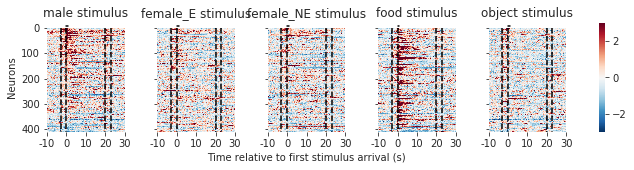

In [19]:
# Figure 1E
vs={}
for s in list(STIMULI):
    vs[s.replace(' ','')]=np.row_stack(first_trial_df.query('m!= "779" and trial==0 and d=="w2e1" and s=="%s"'%s).a.values)

sns.set_style('ticks')
f_mean=np.mean(vs['male'][:,23*30:24*30],axis=1)
f_order=np.argsort(f_mean)[::-1]

fig,axs=plt.subplots(1,6,figsize=(10,2),
            gridspec_kw={'width_ratios':[1,1,1,1,1,0.08],'wspace':0.5})
for i,k in enumerate(['male','female_E','female_NE','food','object']):
    if i < 2:
        sns.heatmap(vs[k][f_order],cmap='RdBu_r',vmin=-3,vmax=3,ax=axs[i],cbar=False)
    else:
        sns.heatmap(vs[k][f_order],cmap='RdBu_r',vmin=-3,vmax=3,ax=axs[i],cbar_ax=axs[-1])
    axs[i].set_title('%s stimulus'%k)
    axs[i].plot([23*30,23*30],[0,len(f_order)],color='k',linestyle='--')
    axs[i].plot([43*30,43*30],[0,len(f_order)],color='k',linestyle='--')
    axs[i].plot([20*30,20*30],[0,len(f_order)],color='k',linestyle='--')
    axs[i].plot([46*30,46*30],[0,len(f_order)],color='k',linestyle='--')
    axs[i].set_xticks(np.array([13,23,33,43,53])*30)
    axs[i].set_xticklabels([-10,0,10,20,30],rotation=0)
    axs[i].set_xlim(13*30,53*30)
    axs[i].set_yticks([0,100,200,300,400])
    axs[i].set_yticklabels([])
    axs[i].plot([23*30,24*30],[-10,-10],color='k')
    axs[i].set_ylim(len(f_order),-20)
axs[0].set_yticklabels([0,100,200,300,400])
axs[0].set_ylabel('Neurons')
axs[2].set_xlabel('Time relative to first stimulus arrival (s)')
plt.show()

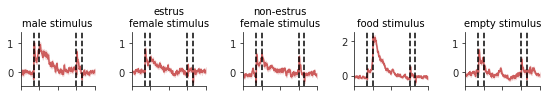

In [20]:
f_order=np.argsort(f_mean)[::-1]
fig,axs=plt.subplots(1,5,figsize=(9.3,1),sharey=False,
                     gridspec_kw={'wspace':0.5})
for i,k in enumerate(['male','female_E','female_NE','food','object']):
    ts=np.std(vs[k][f_order],axis=0)/np.sqrt(len(f_order)-1)
    tm=medfilt(np.mean(vs[k][f_order],axis=0),7)
    axs[i].fill_between(range(len(tm)),tm-ts,tm+ts,color='indianred',alpha=0.2)
    axs[i].plot(tm,color='indianred')
    axs[i].set_title('%s stimulus'%s2title[k],fontsize=10,color='k')
    axs[i].axvline(x=23*30,color='k',linestyle='--')
    axs[i].axvline(x=43*30,color='k',linestyle='--')
    axs[i].axvline(x=20*30,color='k',linestyle='--')
    axs[i].axvline(x=46*30,color='k',linestyle='--')
    axs[i].set_xticks(np.array([13,23,33,43,53])*30)
    axs[i].set_xticklabels([])
    axs[i].set_xlim(13*30,53*30)
    if k !='food':
        axs[i].set_ylim(-0.5,1.4)
sns.despine()
plt.show()

 male      0 411 13.212421389747872 8.471985450855648e-32
 male      1 411 3.4980682632892743 0.023397058259670044
 female_E  0 411 8.812451708569327 1.5807536728695108e-15
 female_NE 0 411 8.875495562737603 9.839834171117044e-16
 female_NE 1 411 7.414784887587219 3.172694791827356e-11
 food      0 411 18.406733133852274 6.22589587955799e-54
 food      1 411 15.795320416063564 1.3822085437799852e-42
 food      2 411 16.54202069370805 8.453126549893488e-46
 food      3 411 13.836899379495767 2.3887476355070054e-34
 food      4 411 14.08376957408945 2.2832180543439246e-35
 food      5 411 16.041870481526896 1.2107659316540984e-43
 food      6 411 16.735662943176933 1.2267823659785853e-46
 food      7 411 15.720790820827975 2.8807006058997584e-42
 food      8 411 15.936432085069592 3.4337456481406393e-43
 food      9 411 15.03002130605646 2.4951942183467938e-39
 object    2 411 -3.622852267913539 0.014757382582486486
 object    3 411 -4.2991454634802 0.0009651479175921151
 object    4 411

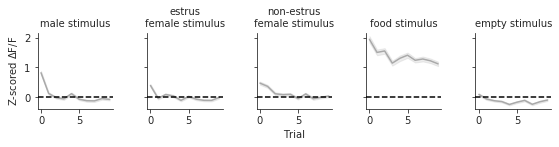

In [21]:
# Figure 1F
labels=[s2title[s.replace(' ','')] for s in STIMULI]

f,axs=plt.subplots(nrows=1,ncols=5,figsize=(9.2,1.4),sharey=True)
colors=['darkgrey']
for j,q in enumerate(['']):
    for i,stim in enumerate(STIMULI):
        subd=first_trial_df.query(q+'m!="779" and s=="%s" and d=="w2e1"'%stim)  # One bad session.
        ms=[]
        ss=[]
        for t in range(10):
            rs=subd.query('trial==%d'%t).first_sec.values
            ms.append(rs.mean())
            ss.append(scipy.stats.sem(rs))
            tstat,p=scipy.stats.ttest_1samp(rs,0)
            if p*45<0.05:
                print(q,stim,t,len(rs),tstat,p*45)
        axs[i].plot(ms,c=colors[j],label=labels[j])
        axs[i].fill_between(np.arange(len(ms)),
                            np.array(ms)-np.array(ss),
                            np.array(ms)+np.array(ss),
                            color=colors[j],
                           alpha=0.2)
        sns.despine()
        axs[i].axhline(y=0,color='k',linestyle='--',zorder=20)
        axs[i].set_title(s2title[stim.replace(' ','')]+' stimulus', fontsize=10)
axs[2].set_xlabel('Trial')
axs[0].set_ylabel('Z-scored $\Delta$F/F')
plt.subplots_adjust(wspace=0.45)
plt.show()


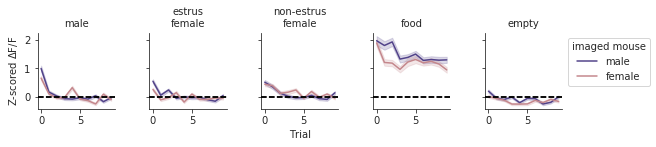

                               GEE Regression Results                              
Dep. Variable:                   responses   No. Observations:                 4110
Model:                                 GEE   No. clusters:                      411
Method:                        Generalized   Min. cluster size:                  10
                      Estimating Equations   Max. cluster size:                  10
Family:                           Gaussian   Mean cluster size:                10.0
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Wed, 14 Jun 2023   Scale:                           0.676
Covariance type:                    robust   Time:                         16:10:54
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.2908      0.041      7.025      0.000  

In [22]:
labels=['male','female']
colors = mf_cols
for cond in ['sexualExperience']:
    mfdiff_list = {'sex':[],
               'responses':[],
               'stimulus':[],
               'trial':[],
               'mdc':[]}
    f,axs=plt.subplots(nrows=1,ncols=5,figsize=(9.4,1.4),sharey=True)
    for j,q in enumerate(['sex=="M" and ','sex=="F" and ']):
        for i,stim in enumerate(STIMULI):
            subd=first_trial_df.query(q+'m!="779" and s=="%s" and condition=="%s"'%(stim,cond))
            ms=[]
            ss=[]
            for t in range(10):
                rs=subd.query('trial==%d'%t).first_sec.values
                ms.append(rs.mean())
                ss.append(scipy.stats.sem(rs))
                tstat,p=scipy.stats.ttest_1samp(rs,0)
                mfdiff_list['sex']+=[labels[j]]*len(rs)
                mfdiff_list['responses']+=list(rs)
                mfdiff_list['stimulus']+=[stim]*len(rs)
                mfdiff_list['trial']+=[t]*len(rs)
                mfdiff_list['mdc']+=[m+'_'+d+'_'+str(c) for m,d,c in subd.query('trial==%d'%t)[['m','d','c']].values]
            axs[i].plot(ms,c=colors[j],label=labels[j])
            axs[i].fill_between(np.arange(len(ms)),
                                np.array(ms)-np.array(ss),
                                np.array(ms)+np.array(ss),
                                color=colors[j],
                               alpha=0.2)
            sns.despine()
            axs[i].axhline(y=0,color='k',linestyle='--',zorder=20)
            axs[i].set_title(s2title[stim.replace(' ','')],fontsize=10)
    axs[2].set_xlabel('Trial')
    axs[0].set_ylabel('Z-scored $\Delta$F/F')
    axs[-1].legend(title='imaged mouse',frameon=True,loc='upper right',
                   bbox_to_anchor=(2.2, 1))
    plt.subplots_adjust(wspace=0.45)
    plt.show()

for s in STIMULI:
    mf_diff = pd.DataFrame(mfdiff_list)
    md = smf.gee(formula="responses ~ C(sex) * trial", groups='mdc',data=mf_diff.query('stimulus=="%s"'%s))
    mdf = md.fit()
    print(mdf.summary())
    print(s)
    print(mdf.pvalues*5)

## Figure 2

In [23]:
import pickle
with open('./mdc2F.p', 'rb') as f:
    md2F = pickle.load(f)
with open('./mdc2pix.p', 'rb') as f:
    mdc2pix = pickle.load(f)

In [24]:
example_m = '773'
example_cells = [1003, 1000, 1001]

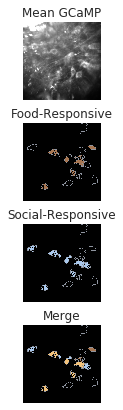

In [25]:
# Figure 2A
overlay_fov_selectivity(example_m, 'w2e1', ['male     ', 'food     '])

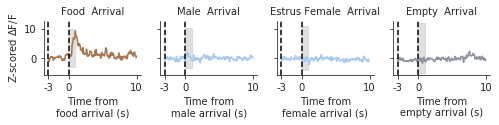

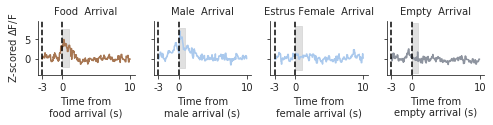

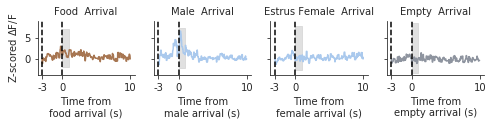

In [26]:
# Figure 2B

for example_c in example_cells:
    fig,axs=plt.subplots(nrows=1,ncols=4,figsize=(8,1),sharey=True)
    for i, (stim, title, color) in enumerate([['food     ', 'Food ', 'brown'],
                                        ['male     ', 'Male ', 'blue'],
                                        ['female_E ', 'Estrus Female ', 'blue'],
                                        ['object   ', 'Empty ', 'grey']]):
        example_trace=(first_trial_df.query('m=="%s" and d=="w2e1" and c==%d and trial==0 and s=="%s"'%(example_m,example_c, stim)).a.values[0])
        axs[i].plot(medfilt(example_trace[20*30:33*30], 5), color=kcols[color])
        axs[i].set_title('%s Arrival'%title,fontsize=10)

    for a in axs:
        y1,y2=a.get_ylim()
        a.fill_between(x=np.arange(3*30,4*30),y1=y1,y2=y2,zorder=0,alpha=0.7,
                      color='lightgrey')

    for a in axs:
        a.axvline(x=30*3,color='k',linestyle='--')
        a.axvline(x=0,color='k',linestyle='--')
        sns.despine()
        a.set_xticks([0,30*3,30*13])
        a.set_xticklabels([-3,0,10])
    axs[0].set_ylabel('Z-scored $\Delta$F/F')
    axs[1].set_xlabel('Time from\nmale arrival (s)')
    axs[0].set_xlabel('Time from\nfood arrival (s)')
    axs[2].set_xlabel('Time from\nfemale arrival (s)')
    axs[3].set_xlabel('Time from\nempty arrival (s)')
    plt.show()

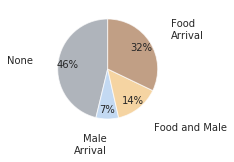

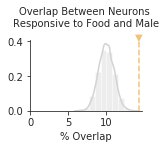

411


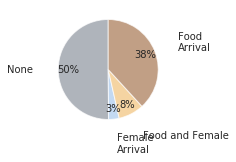

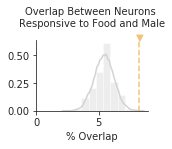

411


In [27]:
# Figure 2C, D
cols=['m','c','d','s','condition','sex','letter']
responsive_df = first_trial_df.query('trial==0').groupby(cols).mean().reset_index().query('m!="779" or d!="w2e1"')
responsive_df['activity'] = responsive_df['first_sec']
responsive_df['is_active']=responsive_df['activity']>A_THRESH

p_responsive_df = get_percent_responsive(responsive_df)
cols=[kcols[i] for i in ['grey','blue','gold','brown']]
c = 'sexualExperience'
for kind in ['male     ', 'female_E ']:
    dat = p_responsive_df.query('social_type=="%s" and cond=="%s"'%(kind,c))
    ns,t = dat.query("stim=='social' and denom=='all'")[['n','t']].values[0]
    nf = dat.query("stim=='food' and denom=='all'")['n'].values[0]
    no = dat.query("stim=='social' and denom=='overlap'")['n'].values[0]
    nnone = t - (nf+ns-no)
    plt.figure(figsize=(2.3,2.3))
    if kind=="female_E ":
        labels = ['None','Female\nArrival','Food and Female','Food\nArrival'] 
    else:
        labels = ['None','Male\nArrival','Food and Male','Food\nArrival']

    plt.pie([nnone,ns-no,no,(nf-no)],
            colors=cols, labels=labels,
            autopct='%1.0f%%',startangle=90,
            labeldistance=1.5,pctdistance=0.8,
            wedgeprops={'alpha':0.7})   
    plt.show()
    if kind=="female_E":
        make_overlap_plot(no, t, nf, ns, color=kcols['gold'],
                          title = "Overlap Between Neurons\nResponsive to Food and Female")
    else:
        make_overlap_plot(no, t, nf, ns, color=kcols['gold'])
    print(t)

Intercept    0.523393
food         0.120764
object       0.663918
dtype: float64


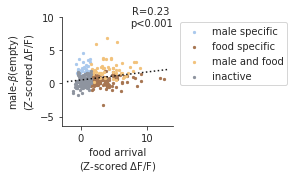

0.2947937938395195 1.100258458247558e-09 411
LinregressResult(slope=0.17457946104669678, intercept=0.4859302811345345, rvalue=0.29479379383951954, pvalue=1.1002584582471671e-09, stderr=0.02798153437820248, intercept_stderr=0.08069165005859603) 411


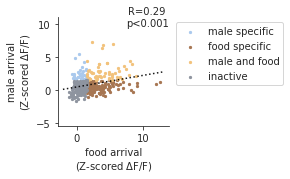

Intercept    0.225029
food         0.068588
object       0.413332
dtype: float64


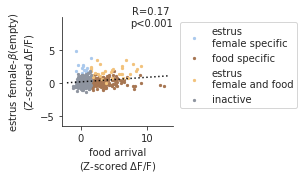

0.23718198155235343 1.154175875460999e-06 411
LinregressResult(slope=0.10209135078516074, intercept=0.20170542719370013, rvalue=0.23718198155235348, pvalue=1.1541758754606065e-06, stderr=0.020676302032602668, intercept_stderr=0.0596252123121702) 411


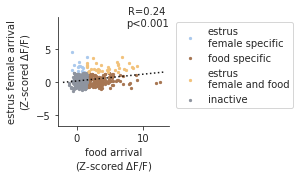

In [36]:
# Figure 2E,F
corr_plot(responsive_df, 'male     ', 'food     ',
          'sexualExperience', 'sexualExperience')

corr_plot(responsive_df, 'female_E ', 'food     ',
          'sexualExperience', 'sexualExperience')

## Figure 3

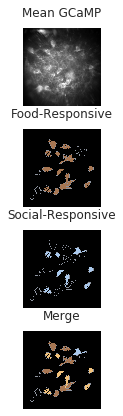

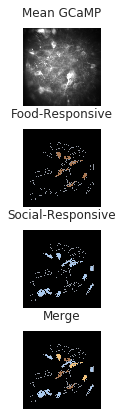

In [250]:
# Figure 3B
example_m = '344'
overlay_fov_selectivity(example_m, 'w2e2', ['male     ', 'food     '])  # Hungry.
overlay_fov_selectivity(example_m, 'w2e3', ['male     ', 'food     '])  # Sated.

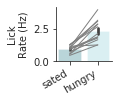

In [257]:
# Figure 3C
order=['sated','hungry']
col_order=[gc_cols[c] for c in ['sated','hungry']]
pal=['tab:orange','tab:green']
plt.figure(figsize=(1,1))
sns.barplot(data=lick_df,x='cond',y='licks',ci=68,order=order,alpha=0.3,palette=col_order)
for m,dat in lick_df.sort_values(['m','cond']).groupby('m'):
    plt.plot([1,0],dat.licks.values,color='grey',linewidth=1)
sns.despine()
plt.xlabel('')
plt.ylabel('Lick\nRate (Hz)')
plt.xticks(rotation=30,ha='right')
plt.show()

13.179788832548528 4.502989383749842e-26 137


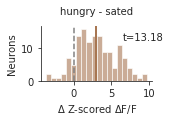

In [288]:
# Figure 3D
stim = 'food     '

c1='sated'
c2='hungry'

sub_df=first_trial_df.query('condition!="initial" and trial==0 and s=="%s" and letter!="-"'%stim)
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==6])
    
rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m', 'letter'])


a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

f=plt.figure(figsize=(2,1))
plt.hist(b-a,bins=20,alpha=0.6,color=kcols['brown'])
t,p=ttest_1samp(b-a,0)
plt.title('%s - %s'%(c2,c1),size=10)
plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(t,p,len(a))
plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
plt.ylabel('Neurons')
sns.despine()
plt.axvline(x=np.mean(b-a),color=kcols['brown'],linewidth=2)
plt.axvline(0,linestyle='--',color='grey')
plt.show()

In [95]:
# Figure 3E
plot_sankey('sated','hungry','','(s=="male     " or s =="female_E ")')

initial 69 73 30 132 244
baseline 90 178 58 198 408
sated 80 110 42 279 427
hungry 130 289 116 91 394
sexualExperience 110 191 71 181 411
sexualExperience_hungry 93 252 85 59 319
sexualExperience_sated 102 91 40 186 339
overlap sated 1 hungry 1 food -9.101674158045396 8.894995315053082e-20 68.0 427.0 173.0 394.0
overlap sated 1 hungry 1 male 3.1430361637452617 0.0016720518092755445 38.0 427.0 14.0 394.0
overlap sated 1 hungry 1 mixed -7.196523828194543 6.17669984460279e-13 42.0 427.0 116.0 394.0


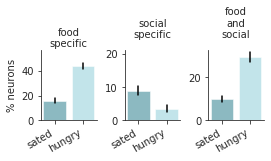

In [126]:
# Figure 3F
make_bar_plots(p_responsive_df, 'sated 1', 'hungry 1', 'sated', 'hungry', 'both')

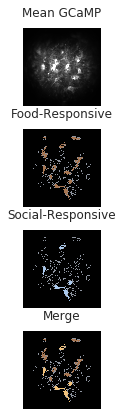

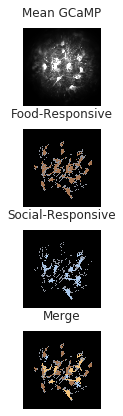

In [251]:
# Figure 3H
example_m = '318'
overlay_fov_selectivity(example_m, 'w1e1', ['male     ', 'food     '])  # Hungry.
overlay_fov_selectivity(example_m, 'w2e1', ['male     ', 'food     '])  # Sated.

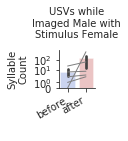

In [286]:
# Figure 3I
male2femalecalls={('307', 'w1e1'): 6,
 ('775', 'w2e1'): 2,
 ('309', 'w1e1'): 2,
 ('776', 'w2e1'): 590,
 ('773', 'w2e1'): 59,
 ('776', 'w1e1'): 0,
 ('307', 'w2e1'): 7,
 ('773', 'w1e1'): 23,
 ('309', 'w2e1'): 3,
 ('775', 'w1e1'): 1}

mds=male2femalecalls.keys()
mdcalls=pd.DataFrame({'m':[md[0] for md in mds],
                     'd':[md[1] for md in mds],
                     'c':[male2femalecalls[md] for md in mds],
                    'sex':[mouse2sex[md[0]] for   md in mds]}).sort_values(['m','d'])

order=['w1e1','w2e1']
pal=['royalblue','tab:red']
usv_count_df['c_log']=np.log(usv_count_df['c'])
import seaborn as sns
plt.figure(figsize=(0.65,0.7))
sns.barplot(data=mdcalls,x='d',y='c',order=order,ci=68,alpha=0.3,palette=pal)
# sns.swarmplot(data=mdcalls,x='d',y='c',order=order,palette=pal)
for m,dat in mdcalls.groupby('m'):
    plt.plot([0,1],dat.c.values,color='grey',linewidth=1)
plt.yscale('symlog')
sns.despine()
plt.xticks([0,1],
           ['before','after'],
          rotation=30,ha='right',size=10)
plt.title('USVs while\nImaged Male with\nStimulus Female',size=10)
plt.xlabel(' ',size=10)
plt.ylabel('Syllable\nCount',size=10)
plt.show()

2.24987923589415 0.026789522725188863 95


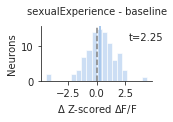

In [294]:
# Figure 3J

stim="opposite"

q2='(m not in %s) and '%cohort1
q=q2+ '((sex=="M" and s=="female_E ") or (sex=="F" and s=="male     ")) and '
sub_df=first_trial_df.query(q+'condition!="initial" and trial==0 and letter!="-"')
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==6])

sub_food = first_trial_df.query(q2+'s=="food     " and (condition=="baseline" or condition=="sexualExperience") and trial==0 and letter!="-"')
cells_responsive_to_food=set([(m,l) for  (m,l,c) in zip(sub_food.m.values,
                     sub_food.letter.values,sub_food.first_sec.values) if c>A_THRESH])

cells_in_all=cells_responsive_to_food.intersection(cells_in_all)
                              
c1='baseline'
c2='sexualExperience'

    
rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m', 'letter'])


a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

f=plt.figure(figsize=(2,1))
plt.hist(b-a,bins=20,alpha=0.6,color=kcols['blue'])
t,p=ttest_1samp(b-a,0)
plt.title('%s - %s'%(c2,c1),size=10)
plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(t,p,len(a))
plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
plt.ylabel('Neurons')
sns.despine()
plt.axvline(x=np.mean(b-a),color=kcols['blue'],linewidth=2)
plt.axvline(0,linestyle='--',color='grey')
plt.show()

In [96]:
# Figure 3K
plot_sankey('baseline',
            'sexualExperience',
            'm not in %s and '%cohort1,
            '(sex=="M" and s=="female_E ") or (sex=="F" and s=="male     ")')

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:119: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:120: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:121: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

initial 55 73 21 137 244
baseline 34 162 26 151 321
sated 39 78 23 232 326
hungry 56 232 52 47 283
sexualExperience 57 156 42 135 306
sexualExperience_hungry 56 252 51 62 319
sexualExperience_sated 39 91 16 225 339
overlap baseline 1 baseline 2 food 1.3040712886250918 0.19220927715757208 136.0 321.0 114.0 306.0
overlap baseline 1 baseline 2 male -1.542588011163664 0.122930768724254 8.0 321.0 15.0 306.0
overlap baseline 1 baseline 2 mixed -2.2368978930625603 0.02529301430400412 26.0 321.0 42.0 306.0


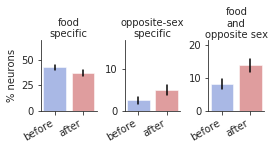

initial 24 73 17 164 244
baseline 53 162 35 141 321
sated 31 78 20 237 326
hungry 61 232 52 42 283
sexualExperience 58 156 41 133 306
sexualExperience_hungry 60 252 56 63 319
sexualExperience_sated 90 91 36 194 339
overlap baseline 1 baseline 2 food 0.5071567561559822 0.6120448344651668 127.0 321.0 115.0 306.0
overlap baseline 1 baseline 2 male 0.020415463753822482 0.9837119481297263 18.0 321.0 17.0 306.0
overlap baseline 1 baseline 2 mixed -0.9489607780792861 0.34264056074922056 35.0 321.0 41.0 306.0


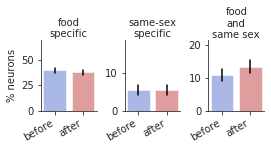

In [130]:
# Figure 3L
p_responsive_df_no_cohort1 = get_percent_responsive(responsive_df.query('m not in %s'%cohort1))
make_bar_plots(p_responsive_df_no_cohort1,'baseline 1','baseline 2','before','after', 'opposite')
make_bar_plots(p_responsive_df_no_cohort1,'baseline 1','baseline 2','before','after', 'same')

## Figure 4

In [18]:
## Figure 4C,D 
phasic_activity = {'m':[],
                  'd':[],
                   'cell':[],
                   'letter':[],
                  'c':[],
                  'p':[]}
for (m,d),data in d_all.items():
    for c,f,n in zip(data[F2I['cell_ids']][0],data[F2I['neuron_F']],data[F2I['neuropil_F']]):
        raw = f-0.58*n
        p = get_peaks(f)
        phasic_activity['p'].append(len(p)/len(raw)*30)
        phasic_activity['m'].append(m)
        phasic_activity['d'].append(d)
        phasic_activity['c'].append(md2condition[(m,d)])
        phasic_activity['cell'].append(c)
        phasic_activity['letter'].append(mdc2letter.get((m,d,c)))

transients_df = pd.DataFrame(phasic_activity)

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide
/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in true_divide


/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


                               GEE Regression Results                              
Dep. Variable:                           p   No. Observations:                  436
Model:                                 GEE   No. clusters:                       15
Method:                        Generalized   Min. cluster size:                   2
                      Estimating Equations   Max. cluster size:                  60
Family:                           Gaussian   Mean cluster size:                29.1
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Sun, 11 Jun 2023   Scale:                           0.013
Covariance type:                    robust   Time:                         08:44:22
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.2268      0.012     18.195      0.000       0.202       0.25

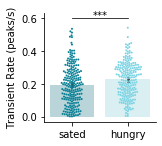

In [34]:
subd = transients_df.query('(c=="sated" or c=="hungry") and p>0')
subd['key']=['_'.join(mc) if mc[1] else None for mc in subd[['m','letter']].values]
subd = subd.query('key in %s'%mcs)
subd = subd.sort_values(['key','c'])
plt.figure(figsize=(2,2))
sns.barplot(data=subd,
           x='c',y='p',ci=68,
           order=['sated','hungry'],alpha=0.3,
           palette=[gc_cols[s] for s in ['sated', 'hungry']])
sns.swarmplot(data=subd,
           x='c',y='p',
           order=['sated','hungry'],size=2,
           palette=[gc_cols[s] for s in ['sated', 'hungry']])
md = smf.gee(formula="p ~ C(c)",
             groups='m',
             data=subd)
mdf = md.fit()
print(mdf.summary())
plt.ylabel('Transient Rate (peaks/s)')
plt.xlabel('')
plt.plot([0,1],[0.6,0.6],color='k',linewidth=0.75)
plt.text(0.5,0.6,'***',ha='center')
sns.despine()
print(mdf.pvalues)
print(ttest_rel(subd.query('c=="sated"').p, subd.query('c=="hungry"').p), len(subd.query('c=="hungry"').p))

In [35]:
# Subset only cells recorded on both days.
mc_counts = Counter([tuple(t) for t in transients_df.query('(c=="sated" or c=="hungry") and p>0')[['m','letter']].values])
mcs = ['_'.join(k) for k,v in mc_counts.items() if k[1] and v==2]

In [36]:
# Visualize 10 examples.
mldiff = {'m':[],'l':[],'d':[]}

examples = ['_'.join(k) for k in pd.DataFrame(mldiff).sort_values('d',ascending=False).head(10)[['m','l']].values]

for (m,l),dat in subd.groupby(['m','letter']):
    dat = dat.sort_values('c',ascending=True)
    diff = dat.p.values[0]-dat.p.values[1]
    mldiff['m'].append(m)
    mldiff['l'].append(l)
    mldiff['d'].append(diff)
    
for r in subd.query('key in %s'%examples).iterrows():
    m,d,c,cond,letter = r[1][['m','d','cell','c', 'letter']].values
    k=(m,d)
    fs=30
    c_idx = np.nonzero(d_all[k][F2I['cell_ids']][0]==c)[0][0]
    dff = medfilt(get_dff(d_all[k][F2I['neuron_F']][c_idx],d_all[k][F2I['neuropil_F']][c_idx]),7)
    peaks = get_peaks(d_all[k][F2I['neuron_F']][c_idx]-0.58*d_all[k][F2I['neuropil_F']][c_idx])
    plt.figure(figsize=(4,1))
    plt.plot(dff,color=gc_cols[cond])
    plt.scatter(peaks,dff[peaks],color='r',s=5,zorder=100)
    s=fs*60*27
    e=s+fs*60*2
    plt.xlim(s,e)
    plt.ylim(-1,4)
    plt.title(f'{m} {letter} {cond}')
    plt.plot([s,s],[1,2],linewidth=0.75,color='k')
    plt.plot([s,s+fs*10],[-0.7,-0.7],linewidth=0.75,color='k')
    plt.axis('off')
    plt.show()

## Load supplementary behavioral data

In [139]:
body_files=glob.glob('../../dlc_body_all/*.csv')
pupil_files=glob.glob('../../dlc_pupil_all/*.csv')

In [147]:
c1date2day={'20200309':'w1e1',
            '20200310':'w1e1',
            '20200311':'w1e2',
            '20200313':'w1e3',
            '20200316':'w2e1'}

puppairs=[['pupil_12oclock','pupil_6oclock'],
         ['pupil_3oclock','pupil_9oclock'],
         ['pupil_1.5','pupil_7.5'],
         ['pupil_4.5','pupil_10.5']]


def nan_helper(y):
    """Helper to handle indices and logical indices of NaNs.

    Input:
        - y, 1d numpy array with possible NaNs
    Output:
        - nans, logical indices of NaNs
        - index, a function, with signature indices= index(logical_indices),
          to convert logical indices of NaNs to 'equivalent' indices
    Example:
        >>> # linear interpolation of NaNs
        >>> nans, x= nan_helper(y)
        >>> y[nans]= np.interp(x(nans), x(~nans), y[~nans])
    """
    if len(y) == 0:
        return (y)
    return np.isnan(y), lambda z: z.nonzero()[0]

def interp_nan(y,maxdist=500):
    nans, x= nan_helper(y)
    if np.sum(nans) == y.size:
        y=np.ones(y.shape)*500
    else:
        y[nans]= np.interp(x(nans), x(~nans), y[~nans])
    return(y)

md2pupfile={}
for bf in pupil_files:
    mouse=bf.split('/')[-1].split('_')[0]
    day=bf.split('/')[-1].split('_')[1]
    if day == 'pupil':
        day=c1date2day[bf.split('/')[-1].split('_')[2]]
    if (mouse,day) not in d_all:
        print(mouse,day)
        continue

    md2pupfile[(mouse,day)]=bf
    
bfdict={}
nosedists={}
reardists={}
forepawdists={}
eyedists={}
eyedists_full={}
paw={}
nose={}
tongueout={}
tonguex={}
eyeopen={}
running_speeds={}
running_speeds_full={}
running_speeds_full_z={}
running_mean={}
pupil={}
pupil_full={}
pupil_full_z={}


def get_social_dist(dlc,body_part,imaged_nose):
    target_pos=dlc[body_part][['x','y']]
    target_not_seen=medfilt(dlc[body_part]['likelihood'],11)<0.5
    social_dist=medfilt(np.linalg.norm(target_pos-imaged_nose,axis=1),11)
    social_dist[target_not_seen]=np.nan
    return (social_dist)

def get_running_speed(dlc):
    velocity=np.zeros(len(dlc['LeftForepawTip']['x']))
    velocity[5:]=np.linalg.norm(dlc['LeftForepawTip'][['x','y']].values[5:]-dlc['LeftForepawTip'][['x','y']].values[:-5],axis=1)
    return (velocity)

def get_eyelid(dlc):
    eye=np.linalg.norm(dlc['EyeTop'][['x','y']].values-dlc['EyeBottom'][['x','y']].values,axis=1)
    eye=medfilt(eye,11)
    return(eye)
    
social_stims=['male     ','female_E ','female_NE']

for bf in body_files:
    mouse=bf.split('/')[-1].split('_')[0]
    day=bf.split('/')[-1].split('_')[1]
    if day=="body":
        day=c1date2day[bf.split('/')[-1].split('_')[2]]
    if (mouse,day) in pupil_full or (mouse,day) not in d_all:
        continue
    else:
        print(mouse,day)
    bfdict[(mouse,day)]=bf
    dlc=pd.read_csv(bfdict[(mouse,day)],header=[1,2])
    body_parts=set([d[0] for d in dlc.columns])
    
    nose=np.median(dlc['NoseTip'][['x','y']],axis=0)

    nose_dist=get_social_dist(dlc,'TargetNoseTip',nose)
    eye_dist=get_social_dist(dlc,'TargetEyeCenter',nose)
    rear_dist=get_social_dist(dlc,'TargetRear',nose)
    forepaw_dist=get_social_dist(dlc,'TargetForepawTip',nose)
    tongueout_proba=medfilt(dlc['Tongue']['likelihood'],5)
    tongueout_x=medfilt(dlc['Tongue']['x'],5)
    speed=get_running_speed(dlc)
    speed_z = (speed-speed.mean())/speed.std()
    eyelid=get_eyelid(dlc)
    
    cam_times=d_all[(mouse,day)][F2I['camera_times']][0]
    starts,ends=d_all[(mouse,day)][F2I['trial_starts']][0],d_all[(mouse,day)][F2I['trial_ends']][0]
    stims=d_all[(mouse,day)][F2I['stimuli']]
    
    
    nosedists[(mouse,day)]={s:[] for s in SOCIAL_STIMULI}
    reardists[(mouse,day)]={s:[] for s in SOCIAL_STIMULI}
    eyedists[(mouse,day)]={s:[] for s in SOCIAL_STIMULI}
    eyedists_full[(mouse,day)]={s:[] for s in SOCIAL_STIMULI}
    forepawdists[(mouse,day)]={s:[] for s in SOCIAL_STIMULI}
    tongueout[(mouse,day)]=[]
    tonguex[(mouse,day)]=[]
    running_speeds[(mouse,day)]={s:[] for s in STIMULI}
    running_speeds_full[(mouse,day)]={s:[] for s in STIMULI}
    running_speeds_full_z[(mouse,day)]={s:[] for s in STIMULI}
    eyeopen[(mouse,day)]={s:[] for s in STIMULI}
    pupil[(mouse,day)]={s:[] for s in STIMULI}
    pupil_full[(mouse,day)]={s:[] for s in STIMULI}
    pupil_full_z[(mouse,day)]={s:[] for s in STIMULI}
    
    running_mean[(mouse,day)] = np.mean(speed)

    avgd=[]
    if (mouse,day) in md2pupfile:
        pup=pd.read_csv(md2pupfile[(mouse,day)],header=[1,2])
        avgd=np.mean([np.linalg.norm(pup[a][['x','y']]-pup[b][['x','y']],axis=1) for a,b in puppairs],axis=0)
        avgl=np.mean([pup[a]['likelihood'] for a in np.concatenate(puppairs)],axis=0)
        avgd[avgl<0.995]=np.nan
        avgd=medfilt(interp_nan(avgd),11)
        avgd_z = (avgd-avgd.mean())/avgd.std()
    else:
        print('missing pupil %s %s'%(mouse, day))
    
    for ts,te,s in zip(starts,ends,stims):
        if s not in STIMULI:
            continue
        cam_s=np.where(cam_times>ts)[0][0]+300
        cam_e=cam_s+100*20
        if s in social_stims:
            nosedists[mouse,day][s].append(nose_dist[cam_s:cam_e])
            reardists[(mouse,day)][s].append(rear_dist[cam_s:cam_e])
            forepawdists[(mouse,day)][s].append(forepaw_dist[cam_s:cam_e])
            eyedists[(mouse,day)][s].append(eye_dist[cam_s:cam_e])
            eyedists_full[(mouse,day)][s].append(eye_dist[cam_s-43*100:cam_e+43*100])
        elif s == "food     ":
            tongueout[(mouse,day)].append(tongueout_proba[cam_s:cam_e])
            tonguex[(mouse,day)].append(tongueout_x[cam_s:cam_e])
        eyeopen[(mouse,day)][s].append(eyelid[cam_s:cam_e])
        running_speeds[(mouse,day)][s].append(speed[cam_s:cam_e])
        running_speeds_full[(mouse,day)][s].append(speed[cam_s-43*100:cam_e+43*100])
        running_speeds_full_z[(mouse,day)][s].append(speed_z[cam_s-43*100:cam_e+43*100])
        if len(avgd):
            pupil[(mouse,day)][s].append(avgd[cam_s:cam_e])
            pupil_full[(mouse,day)][s].append(avgd[cam_s-43*100:cam_e+43*100])
            pupil_full_z[(mouse,day)][s].append(avgd_z[cam_s-43*100:cam_e+43*100])


352 w1e3
309 w2e3
307 w1e3
788 w1e2
305 w1e1
344 w2e2
352 w2e1
776 w2e2
791 w1e2
791 w2e1
346 w2e3
778 w1e1
307 w1e1
304 w1e3
344 w1e3
716 w1e1
776 w2e3
776 w1e1
345 w1e2
352 w1e1
307 w2e3
771 w2e1
346 w1e3
305 w2e1
345 w1e1
773 w2e1
309 w2e1
778 w2e1
352 w2e2
344 w2e3
305 w2e2
305 w1e3
344 w1e1
missing pupil 344 w1e1
778 w1e3
773 w2e3
779 w2e3
773 w2e2
779 w2e2
345 w2e1
304 w2e2
775n w1e2
778 w2e3
309 w1e3
305 w1e2
350 w2e3
352 w1e2
775 w1e2
775 w1e1
309 w1e2
788 w1e3
776 w1e2
788 w2e1
307 w2e2
350 w1e1
775n w2e2
346 w1e2
344 w1e2
779 w1e1
304 w2e1
779 w1e2
318 w1e2
318 w1e3
350 w1e2
791 w1e3
779 w2e1
775n w2e3
778 w2e2
716 w1e3
350 w2e2
345 w2e2
716 w2e1
350 w2e1
345 w1e3
318 w2e3
307 w2e1
346 w2e1
773 w1e1
778 w1e2
350 w1e3
791 w1e1
771 w1e2
345 w2e3
771 w1e1
773 w1e3
304 w1e1
missing pupil 304 w1e1
346 w2e2
318 w2e1
775n w1e3
304 w1e2
775 w1e3
775 w2e1
346 w1e1
775n w1e1
318 w2e2
344 w2e1
716 w1e2
352 w2e3
305 w2e3
788 w1e1
775n w2e1
307 w1e2
776 w2e1
771 w1e3
773 w1e2
776 w1e3
309

In [190]:
pupil_dict = {'m':[],'d':[],'s':[],'p':[],'cond':[],'ns':[]}


for m,d in pupil_full:
    if len(pupil_full[(m,d)]['female_NE'])==0:
        continue
    form=[]
    for i,s in enumerate(list(STIMULI)):
        if len(pupil_full_z[(m,d)][s])==0 or len(pupil_full_z[(m,d)][s][0])==0:
            continue
        form.append(interp_nan(np.array(pupil_full_z[(m,d)][s]))[:,:4000])
    if len(form)==0:
        continue
    mm=np.mean(np.concatenate(form))
    ms=np.std(np.concatenate(form))
    for i,s in enumerate(STIMULI):
        if len(pupil_full[(m,d)][s])==0 or len(pupil_full_z[(m,d)][s][0])==0:
            continue
        ns=interp_nan(np.array(pupil_full_z[(m,d)][s]))[:,2000:-2000]
        
        ns=(ns-mm)/ms
        pmin=-3
        pmax=3
        pupil_dict['m'].append(m)
        pupil_dict['d'].append(d)
        pupil_dict['s'].append(s)
        pupil_dict['p'].append(ns[0][23*100:24*100].mean())
        pupil_dict['ns'].append(ns)
        pupil_dict['cond'].append(md2condition[(m,d)])    
pupil_df = pd.DataFrame(pupil_dict)

In [193]:
before_after_behavior = {'m':[],
                        'd':[],
                         'condition':[],
                        'eyedist':[],
                        'pupilz':[],
                        'speed':[],
                        'eyedist_m':[],
                        'pupilz_m':[],
                        'speed_m':[],
                        'sex':[]}
for k,ed in eyedists.items():
    if k[1] not in ['w1e1','w2e1','w1e2','w1e3']:
        continue
    s = 'male     '
    sex=mouse2sex[k[0]]
    if sex=='M':
        s = 'female_E '
    pup = np.array(pupil_full_z[(k[0],k[1])][s])
    if len(pup)==0:
        continue
    if k[1] in ['w1e2','w1e3']:
        s = 'food     '
        before_after_behavior['eyedist'].append(0)
        before_after_behavior['eyedist_m'].append(0)
    else:
        before_after_behavior['eyedist'].append(ed[s][0][:1000]/PIXELS_PER_MM)
        before_after_behavior['eyedist_m'].append(np.nanmean(ed[s][0][:100])/PIXELS_PER_MM)
    before_after_behavior['speed'].append(medfilt(running_speeds_full[(k[0],k[1])][s][0],11)[20*100:-20*100][2300:3300]/PIXELS_PER_MM/0.1)
    
    before_after_behavior['pupilz'].append(pup[0][2300:3300])
    before_after_behavior['speed_m'].append(np.nanmean(medfilt(running_speeds_full[(k[0],k[1])][s][0],11)[20*100:-20*100][2300:2400])/PIXELS_PER_MM/0.1)
    
    before_after_behavior['pupilz_m'].append(np.nanmean(pup[0][2300:2400]))
    before_after_behavior['m'].append(k[0])
    before_after_behavior['d'].append(k[1])
    before_after_behavior['condition'].append(md2condition[k])
    before_after_behavior['sex'].append(sex)
before_after_df = pd.DataFrame(before_after_behavior)

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning:

Mean of empty slice



## Figure S1

In [134]:
from sklearn.cluster import MiniBatchKMeans

just_active = first_trial_df.query('first_sec>1.5 and condition=="sexualExperience"')
social_and_food = {}
any_food = set([(m,d,c) for m,d,c in just_active.query('s=="food     "')[['m','d','c']].values])
any_social = set([(m,d,c) for m,d,c in just_active.query('s=="male     "')[['m','d','c']].values])
social_and_food = any_food.intersection(any_social)

X = np.row_stack([medfilt(a,13) for a in just_active.query('s=="food     "').a.values])
mdcs_X = just_active.query('s=="food     "')[['m','d','c']].values

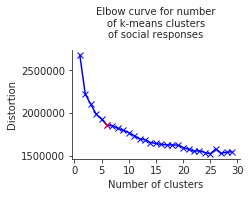

In [135]:
# Figure S1A
distortions = []
for n_clusts in range(1,30):
    kmeans = MiniBatchKMeans(n_clusters=n_clusts,
                             random_state=0,
                             batch_size=100,
                             max_iter=20,
                             init_size=100).fit(X)
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(3,2))
plt.plot(range(1,30), distortions[:29], 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.title('Elbow curve for number\nof k-means clusters\nof social responses',size=10)
plt.plot(range(6,7), distortions[5:6], 'bx-',color='red')
sns.despine()
plt.xticks(np.arange(0,35,5))
plt.show()

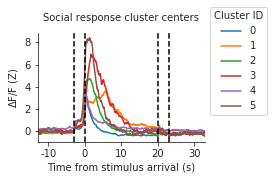

In [136]:
# Figure S1B
n_clusts = 6
kmeans = MiniBatchKMeans(n_clusters=n_clusts,
                         random_state=0,
                         batch_size=3*n_clusts,
                         max_iter=20,
                         init_size=3*n_clusts).fit(X)
plt.figure(figsize=(3,2))
for i,c in enumerate(kmeans.cluster_centers_):
    plt.plot(c,label=i)
plt.legend()
plt.axvline(x=20*30,color='k',linestyle='--')
plt.axvline(x=23*30,color='k',linestyle='--')
plt.axvline(x=43*30,color='k',linestyle='--')
plt.axvline(x=46*30,color='k',linestyle='--')
plt.xlim(10*30,56*30)
plt.xticks(np.array([10,20,30,40,50])*30+3*30,[-10,0,10,20,30])
plt.xlabel('Time from stimulus arrival (s)')
plt.ylabel('$\Delta$F/F (Z)')
sns.despine()
plt.legend(title='Cluster ID', bbox_to_anchor=(1, 0.2),fontsize=10)
plt.title('Social response cluster centers',size=10)
plt.show()

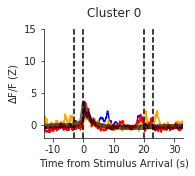

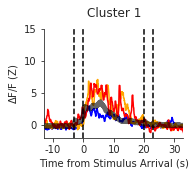

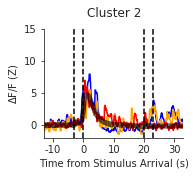

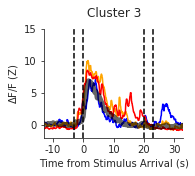

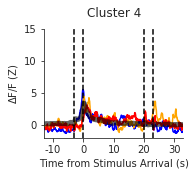

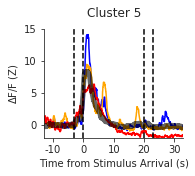

In [137]:
# Figure S1C
clust_per_type = {'cluster':[],'frac_food_social':[]}
for k in range(n_clusts):
    plt.figure(figsize=(2.5,2))
    plt.plot(X[kmeans.labels_==k][0],color='blue')
    plt.plot(X[kmeans.labels_==k][1],color='orange')
    plt.plot(X[kmeans.labels_==k][2],color='red')
    plt.plot(kmeans.cluster_centers_[k],color='black',linewidth=5,alpha=0.6)
    plt.axvline(x=20*30,color='k',linestyle='--')
    plt.axvline(x=23*30,color='k',linestyle='--')
    plt.axvline(x=43*30,color='k',linestyle='--')
    plt.axvline(x=46*30,color='k',linestyle='--')
    plt.title('Cluster %d'%k)
    plt.xlim(10*30,56*30)
    plt.xticks(np.array([10,20,30,40,50])*30+3*30,[-10,0,10,20,30])
    plt.xlabel('Time from Stimulus Arrival (s)')
    plt.ylabel('$\Delta$F/F (Z)')
    sns.despine()
    plt.ylim(-2,15)
    plt.show()
    clust_mdcs = set([(m,d,c) for m,d,c in mdcs_X[kmeans.labels_==k]])
    n_food_social = len(social_and_food.intersection(clust_mdcs))/len(clust_mdcs)
    clust_per_type['cluster'].append(k)
    clust_per_type['frac_food_social'].append(n_food_social)
    

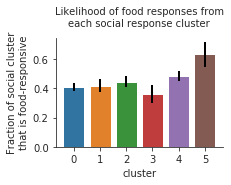

In [138]:
plt.figure(figsize=(3,2))
sns.barplot(data=pd.DataFrame(clust_per_type),
           x='cluster',y='frac_food_social')

for i in kmeans.labels_:
    p = clust_per_type['frac_food_social'][i]
    nob1= Counter(kmeans.labels_)[i]
    ci1 = np.sqrt(nob1*(p)*(1-p))/nob1 #square root (n*p*(1-p))
    plt.plot([i,i],[p-ci1,p+ci1],color='k')

plt.ylabel('Fraction of social cluster\nthat is food-responsive')
plt.title('Likelihood of food responses from\neach social response cluster',size=10)
sns.despine()
plt.show()

## Figure S2

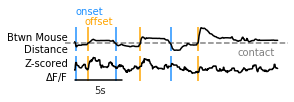

In [150]:
# Figure S2A
cam2neur=np.linspace(0,len(np.array(nosedists[('309','w2e3')]['male     '])[0])-1,30*20).astype(int)
m='345'
d='w1e3'
s='female_NE'
c=4
trial=4
ts=23*30
te=43*30
thresh=120
im_off=[]
im_on=[]
n=interp_nan(np.array(eyedists[(m,d)][s])[:,cam2neur])[trial]
f=mdc2mats[(m,d,c)][s][trial]


fig,axs=plt.subplots(figsize=(4,1),nrows=2)
vel=np.zeros(len(n))
vel[8:-7]=medfilt(n[15:]-n[:-15],7)

bintrace=n<thresh
trigs=find_trigger(bintrace,0.5,0.1,100)
for t in trigs:
    if t==0 or np.sum(bintrace[t:t+10])!=10:
        continue
    axs[0].axvline(x=t,color='dodgerblue')
    axs[1].axvline(x=t,color='dodgerblue')
    t_o=ts+t
    im_on.append(f[t_o-60:t_o+60])

bintrace=n>=thresh
trigs=find_trigger(bintrace,0.5,0.10,100)
for t in trigs:
    if t==0 or np.sum(bintrace[t:t+10])!=10:
        continue
    axs[0].axvline(x=t,color='orange')
    axs[1].axvline(x=t,color='orange')
    t_o=ts+t
    im_off.append(f[t_o-60:t_o+60])

axs[0].axhline(y=thresh,color='grey',linestyle='--')
axs[0].plot(n,color='k')
axs[1].plot(medfilt(f[ts:te],7),color='k')
for ax in axs:
    ax.axis('off')
axs[1].plot([0,140],[-2,-2],color='k')
axs[1].text(75,-3,'5s',va='top',ha='center')
axs[0].text(15*30+30,50,'contact',va='center',color='grey')
axs[0].text(-20,thresh,'Btwn Mouse\nDistance',ha='right',va='center',color='k')
axs[1].text(-20,0,'Z-scored\n$\Delta$F/F',ha='right',va='center',color='k')
axs[0].text(30,300,'offset',ha='left',va='center',color='orange')
axs[0].text(3,380,'onset',ha='left',va='center',color='dodgerblue')
plt.show()

In [159]:
# Figures S2

from scipy.stats import ttest_rel, ttest_1samp

thresh=130
df['sex']=[mouse2sex[m] for m in df.mouse]

contact_test={'m':[],
             'd':[],
             'c':[],
             'on':[],
             'off':[],
             'on_p':[],
             'off_p':[],
             'on_t':[],
             'off_t':[],
             'on_first':[],
             'off_first':[],
             'stimulus':[],
             'condition':[],
              'on_before':[],
             'on_after':[],
             'ond':[],
              'offd':[],
             'on_after_binary':[]}
df_sub=responsive_df.query('stimulus in %s'%social_stims)

for r in df_sub.iterrows():
    m,d,c,s=r[1]['mouse'],r[1]['day'],r[1]['cell'],r[1]['stimulus']
    im_off=[]
    im_on=[]
    if (m,d) not in eyedists:
        print('no file',m,d)
        continue
    
    ns=interp_nan(np.array(eyedists[(m,d)][s])[:,cam2neur])
    fs=mdc2mats[(m,d,c)][s]
    for n,f in zip(ns,fs):

        bintrace=n<thresh
        trigs=find_trigger(bintrace,0.5,0.5,100)
        for t in trigs:
            if t!=0 and np.sum(bintrace[t:t+5])==5:
                t_o=ts+t
                im_on.append(f[t_o-30:t_o+30])

        bintrace=n>=thresh
        trigs=find_trigger(bintrace,0.5,0.1,100)
        
        for t in trigs :
            if t!=0 and np.sum(bintrace[t:t+10])==10:
                t_o=ts+t
                im_off.append(f[t_o-30:t_o+30])
                
    if len(im_on) < 3 or len(im_off)< 3:
        continue        
        
    im_on=np.array(im_on)
    im_off=np.array(im_off)
    ond=(np.mean(im_on[:,30:],axis=1)-np.mean(im_on[:,:30],axis=1))/np.std(im_on[:,:30],axis=1)
    offd=(np.mean(im_off[:,30:],axis=1)-np.mean(im_off[:,:30],axis=1))/np.std(im_off[:,:30],axis=1)
    on_t,on_p=ttest_1samp(ond,0)
    off_t,off_p=ttest_1samp(offd,0)
    
        
    # average difference
    contact_test['ond'].append(ond.mean())
    contact_test['offd'].append(offd.mean())
    
    # average after
    on_after=np.mean(im_on[:,30:],axis=1).mean()
    contact_test['on_after'].append(on_after)
    
    # average after
    on_before=np.mean(im_on[:,:30],axis=1).mean()
    contact_test['on_before'].append(on_before)
    
    # after 2-std away from cell's ITI activity
    before_m=df.query('mouse=="%s" and day== "%s" and cell==%s and time_frame=="before"'%(m,d,c))['activity'].values.mean()
    before_s=df.query('mouse=="%s" and day== "%s" and cell==%s and time_frame=="before"'%(m,d,c))['activity'].values.std()
    contact_test['on_after_binary'].append(np.abs(on_after)>before_m+2*before_s)
    
    
    contact_test['m'].append(m)
    contact_test['d'].append(d)
    contact_test['c'].append(c)
    contact_test['on'].append(im_on)
    contact_test['off'].append(im_off)
    contact_test['on_p'].append(on_p)
    contact_test['off_p'].append(off_p)
    contact_test['on_t'].append(on_t)
    contact_test['off_t'].append(off_t)
    contact_test['on_first'].append(ond[0])
    contact_test['off_first'].append(offd[0])
    contact_test['stimulus'].append(s)
    contact_test['condition'].append(md2condition[(m,d)])


no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w0e1
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2e3
no file 304 w2

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:79: RuntimeWarning:

Mean of empty slice.



no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0e1
no file 305 w0

no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 344 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 345 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0e1
no file 350 w0

In [163]:
contact_df=pd.DataFrame(contact_test)
contact_df['sex'] = [mouse2sex[m] for m in contact_df['m']]
contact_df['opposite_sex'] = [(sex=='M' and stim == 'female_E ') or (sex=='F' and stim == 'male     ')
                              for sex,stim in zip(contact_df['sex'],contact_df['stimulus'])]
contact_df['same_sex'] = [(sex=='F' and stim == 'female_E ') or (sex=='M' and stim == 'male     ')
                              for sex,stim in zip(contact_df['sex'],contact_df['stimulus'])]


411
411
411
411


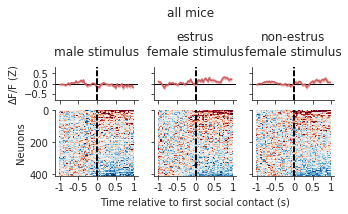

199
199
199
199


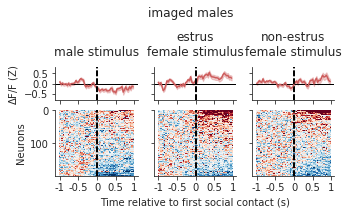

212
212
212
212


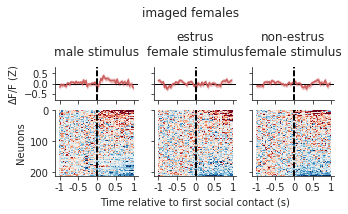

In [165]:
labels=['','_male','_female']
for j,q in enumerate(['','sex=="M" and ','sex=="F" and ']):
    f,axs=plt.subplots(nrows=2,ncols=3,
                             gridspec_kw={'height_ratios':[1, 2]},
                             figsize=(5,2),sharex=True,sharey='row')
    subd=contact_df.query(q+'condition=="sexualExperience" and stimulus=="male     "')['on']
    t=0
    first_onsets=np.row_stack([(o[t]-np.mean(o[t][:30]))/np.std(o[t][:30]) for o in subd if len(o)>t])
    print(len(first_onsets))
    order=np.argsort([o[30:].mean()-o[:30].mean() for o in first_onsets])[::-1]

    for i,stim in enumerate(social_stims):
        subd=contact_df.query(q+'condition=="sexualExperience" and stimulus=="%s"'%stim)['on']
        first_onsets=np.row_stack([(o[t]-np.mean(o[t][:30]))/np.std(o[t][:30]) for o in subd if len(o)>t])
        print(len(subd))
        order=np.argsort([o[30:].mean()-o[:30].mean() for o in first_onsets])[::-1]
        im=axs[1][i].imshow(first_onsets[order],aspect='auto',vmin=-3,vmax=3,cmap='RdBu_r')
        
        # plt.colorbar(im)
        sns.despine()
        axs[0][i].axhline(y=0,color='k',linestyle='-',linewidth=1)
        axs[1][i].set_xticks([0,15,30,45,60])
        axs[1][i].set_xticklabels([-1,-0.5,0,0.5,1])
        axs[0][i].set_yticks([0,1])
        axs[0][i].set_ylim([-0.8,0.8])
        m=np.mean(first_onsets,axis=0)
        s=sem(first_onsets,axis=0)
        axs[0][i].plot(m,color='indianred',)
        axs[0][i].fill_between(np.arange(len(s)),m-s,m+s,alpha=0.3,color='indianred',)
        axs[0][i].set_xlabel('')
        axs[0][i].set_title('%s stimulus'%s2title[stim.replace(' ','')])
        for ax in axs:
            for a in ax:
                a.axvline(x=30,color='k',linestyle='--')
    axs[0][0].set_yticks([-0.5,0,0.5])
    axs[0][0].set_ylabel('$\Delta$F/F (Z)')
    axs[1][0].set_ylabel('Neurons')
    axs[1][1].set_xlabel('Time relative to first social contact (s)')
    if labels[j]:
        plt.suptitle('imaged '+labels[j].replace('_','')+'s',y=1.3)
    else:
        plt.suptitle('all mice',y=1.3)
    plt.show()

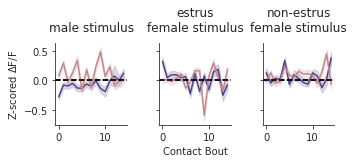

In [166]:
# Figure S2C
f,axs=plt.subplots(nrows=1,ncols=3,figsize=(5,1.5),sharey=True)

mfdiff_list = {'sex':[],
               'responses':[],
               'stimulus':[],
               'trial':[],
               'mdc':[]}
colors=["#514289", "#C4878C"]
labels=['male','female']

for j,q in enumerate(['sex=="M" and ','sex=="F" and ']):
    
    for i,stim in enumerate(social_stims):
        subdf=contact_df.query(q+'condition=="sexualExperience" and stimulus=="%s"'%stim)
        subd=subdf['on']
        ms=[]
        ss=[]
        for t in range(15):
            rs=np.mean(np.row_stack([(o[t]-np.mean(o[t][:30]))/np.std(o[t][:30]) for o in subd if len(o)>t])[:,30:],axis=1)
            ms.append(rs.mean())
            ss.append(scipy.stats.sem(rs))
            tstat,p=scipy.stats.ttest_1samp(rs,0)
            mfdiff_list['sex']+=[labels[j]]*len(rs)
            mfdiff_list['responses']+=list(rs)
            mfdiff_list['stimulus']+=[stim]*len(rs)
            mfdiff_list['trial']+=[t]*len(rs)
            mfdiff_list['mdc']+=[m+'_'+d+'_'+str(c) for m,d,c,o in subdf[['m','d','c','on']].values if len(o)>t]
        axs[i].plot(ms,c=colors[j],label=labels[j])
        axs[i].fill_between(np.arange(len(ms)),
                            np.array(ms)-np.array(ss),
                            np.array(ms)+np.array(ss),
                            color=colors[j],
                           alpha=0.2)
        axs[i].axhline(y=0,linestyle='--',color='k')
        axs[i].set_title(s2title[stim.replace(' ','')]+' stimulus')
        sns.despine()
axs[1].set_xlabel('Contact Bout')
axs[0].set_ylabel('Z-scored $\Delta$F/F')
plt.subplots_adjust(wspace=0.45)
plt.show()
plt.show()

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 due to no predicted samples.



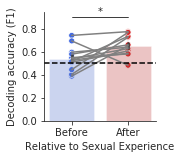

In [188]:
# Figure S2D
from sklearn.model_selection import train_test_split,cross_validate
from sklearn import datasets, svm, metrics, tree, ensemble
from sklearn.decomposition import PCA

decoding_results = {'m':[],'cond':[],'split':[],'f1':[],'ncells':[],'sex':[]}
MIN_CELLS = 8
MIN_TRIALS = 5

for cond in ['baseline','sexualExperience']:
    sub_df = contact_df.query('condition=="%s"'%cond)
    for m in set(sub_df.m):
        df_same = sub_df.query('m=="%s" and same_sex'%m)
        X_same = [np.row_stack([v[i] for v in df_same.on.values]) for i in range(len(df_same.on.values[0]))]
        Y_same = [0]*len(X_same)

        df_opp = sub_df.query('m=="%s" and opposite_sex'%m)
        X_opp = [np.row_stack([v[i] for v in df_opp.on.values]) for i in range(len(df_opp.on.values[0]))]
        Y_opp = [1]*len(X_opp)

        n_samples = len(X_same+X_opp)
        ncells = len(X_same[0])
        if ncells > MIN_CELLS and len(X_same)> MIN_TRIALS and len(X_opp)>MIN_TRIALS:
            
            
            pca = PCA(n_components=MIN_TRIALS*2, svd_solver='arpack')
            X = pca.fit_transform(np.array(X_same+X_opp).reshape((n_samples,-1)))
            Y = np.array(Y_same+Y_opp)

            clf = tree.DecisionTreeClassifier(random_state=0)
        

            # 5-fold cross validation per mouse
            f1s = []
            for i in range(5):
                X_train, X_test, y_train, y_test = train_test_split(
                    X, Y, test_size=0.3, shuffle=True, stratify=Y, random_state = i)
                clf.fit(X_train, y_train)
                predicted = clf.predict(X_test)
                f1 = metrics.f1_score(y_test, predicted,average='binary')
                if f1 != 0:
                    f1s.append(f1)
            if len(f1s):
                decoding_results['m'].append(m)
                decoding_results['cond'].append(cond)
                decoding_results['split'].append(i)
                decoding_results['f1'].append(np.mean(f1s))
                decoding_results['ncells'].append(ncells)
                decoding_results['sex'].append(df_same['sex'].values[0])

decoding_df = pd.DataFrame(decoding_results)
mice_for_plot = [m for m,c in dict(Counter(decoding_df.m)).items() if c==2]
decoding_df = decoding_df.query('m in %s'%mice_for_plot).sort_values(['m','cond'])

plt.figure(figsize=(2,2))
g=sns.barplot(data=decoding_df,
              x='cond' ,
              y='f1',
              alpha=0.3,
              ci=68,
              color='cond',
              palette=['royalblue','tab:red'])

sns.scatterplot(data=decoding_df,
               x='cond' ,
               y='f1',
               hue='cond',
               legend=None,
               palette=['royalblue','tab:red'])
for m, dat in decoding_df.groupby('m'):
    plt.plot([0,1],dat.f1,color='grey')

sns.despine()
plt.axhline(0.5,linestyle='--',color='k')
plt.xlabel('Relative to Sexual Experience')
plt.ylabel('Decoding accuracy (F1)')
plt.xticks([0,1],['Before','After'])
plt.plot([0,1],[0.9,0.9],color='k',linewidth=0.75)
plt.text(0.5,0.92,'*',ha='center')
plt.show()


Ttest_indResult(statistic=-0.16340878993397287, pvalue=0.8711932439611313)
16 19


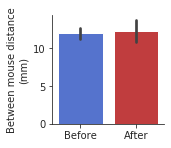

In [201]:
# Figure S2E
behave = 'eyedist_m'
ylab = 'Between mouse distance\n(mm)'

plt.figure(figsize=(2,2))
sns.barplot(data=before_after_df,x='condition', y=behave,
            ci=68,#hue_order=['baseline','sexualExperience'],
            order =['baseline','sexualExperience'],
            palette=[cond2color[c] for c in ['baseline','sexualExperience']])
sns.despine()
plt.xlabel('')
plt.xticks([0,1],['Before','After'])
plt.ylabel(ylab)
print(ttest_ind(before_after_df.query('condition=="baseline"')[behave].dropna(),
              before_after_df.query('condition=="sexualExperience"')[behave].dropna()))
print(len(before_after_df.query('condition=="baseline"')[behave].dropna()),
          len(before_after_df.query('condition=="sexualExperience"')[behave].dropna()))
plt.show()

## Figure S3

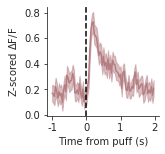

In [204]:
# Figure S3B
all_puff=[]
subd=first_trial_df.query("s=='puff' and trial==0 and d=='w2e1' and m != '779'")
for (mouse,day),dat in subd.groupby(['m','d']):
    dat_a = np.row_stack(dat.a)
    all_puff.append(dat_a)
all_puff = np.row_stack(all_puff)

mean_puff = all_puff.mean(axis=0)[30*19:30*22]
sem_puff = scipy.stats.sem(all_puff)[30*19:30*22]
plt.figure(figsize=(2,2))
plt.plot(mean_puff,color ="#B47E83")
plt.fill_between(x=np.arange(len(sem_puff)),
                   y1=mean_puff-sem_puff,
                   y2=mean_puff+sem_puff,
                   alpha=0.5,
                color="#B47E83")
plt.axvline(x=30,color='k',linestyle='--')
plt.xticks([0,30,60,90],[-1,0,1,2])
plt.xlabel('Time from puff (s)')
sns.despine()
plt.ylabel('Z-scored $\Delta$F/F')
plt.show()

In [206]:
# Figure S3C
cond='sexualExperience'
s2cells={}

ncells=len(responsive_df.query('s=="food     " and condition=="%s"'%(cond)))
print(ncells)
q=''
df_sub=responsive_df.query(q+'condition=="%s" '%(cond))
s2cells['all']=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                           df_sub.day.values,
                                           df_sub.cell.values)])

for s in ['food     ','puff']:
    df_sub=responsive_df.query('condition=="%s" and is_active and stimulus=="%s"'%(cond,s))
    s2cells[s.replace(' ','')]=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                               df_sub.day.values,
                                               df_sub.cell.values)])
    print(s,len(s2cells[s.replace(' ','')]))

q='(stimulus=="male     " or stimulus=="female_E ") and '
df_sub=responsive_df.query(q+' is_active and condition=="%s" '%(cond))
social=set([(m,d,c) for (m,d,c) in zip(df_sub.mouse.values,
                                               df_sub.day.values,
                                               df_sub.cell.values)])

411
food      191
puff 30


10 20 181 200 411


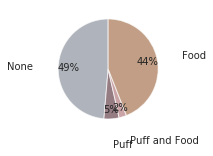

In [208]:
n_puff_food = len(s2cells['puff'] & s2cells['food'])
n_puff = len(s2cells['puff'] - s2cells['food'])
n_food = len(s2cells['food'] - s2cells['puff'])
n_none = (ncells - len(s2cells['food'] | s2cells['puff']))
print(n_puff_food,n_puff,n_food,n_none,sum([n_puff_food,n_puff,n_food,n_none]))

cols=[kcols['grey'], "#68434E","#B47E83", kcols['brown']]
plt.figure(figsize=(2.3,2.3))
plt.pie([n_none, n_puff, n_puff_food, n_food],
        colors=cols,
        labels=['None','Puff','Puff and Food','Food'],
       autopct='%1.0f%%',startangle=90,
       labeldistance=1.5,pctdistance=0.8,
        wedgeprops={'alpha':0.7})
plt.show()

10
411 0.3685


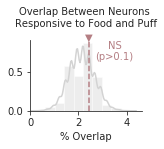

In [209]:
# Figure S3D
noverlap=n_puff_food
print(noverlap)
ntotal=int(ncells)
nfood=int(n_food)
nsocial=int(n_puff)
overlaps=[]
from random import sample
for i in range(10000):
    foodns=set(sample(range(ntotal),nfood))
    socialns=set(sample(range(ntotal),nsocial))
    overlaps.append(len(foodns.intersection(socialns))/ntotal*100)

f=plt.figure(figsize=(2,1.3))
sns.distplot(overlaps,bins=10,color='lightgrey')
plt.axvline(x=noverlap/ntotal*100,color="#B47E83",linestyle='--')
plt.text(noverlap/ntotal*100,f.axes[0].get_ylim()[1],'▼',
         color="#B47E83",ha='center')
plt.text(3.5,f.axes[0].get_ylim()[1],'NS\n(p>0.1)',
         color="#B47E83",ha='center',va='top')
p=np.sum(np.array(overlaps)>=noverlap/ntotal*100)/10000
xmin,xmax=plt.xlim()
plt.xlim((0,xmax))
plt.xlabel('% Overlap',size=10)
plt.rcParams['axes.titlepad'] = 12
plt.title('Overlap Between Neurons \nResponsive to Food and Puff',size=10,va='bottom')
sns.despine()
print(ncells,p)
plt.show()

8 22 102 279 411


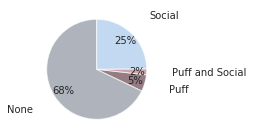

In [210]:
# Figure S3E
n_puff_food = len(s2cells['puff'] & social)
n_puff = len(s2cells['puff'] - social)
n_food = len(social - s2cells['puff'])
n_none = (ncells - len(social | s2cells['puff']))
print(n_puff_food,n_puff,n_food,n_none,sum([n_puff_food,n_puff,n_food,n_none]))
cols=[kcols['grey'], "#68434E","#B47E83", kcols['blue']]
plt.figure(figsize=(2.3,2.3))
plt.pie([n_none, n_puff, n_puff_food, n_food],
        colors=cols,
        labels=['None','Puff','Puff and Social','Social'],
       autopct='%1.0f%%',startangle=90,
       labeldistance=1.5,pctdistance=0.8,
        wedgeprops={'alpha':0.7})
plt.show()

8
411 0.1469


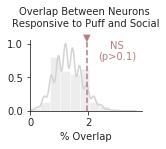

In [211]:
# Figure S3F
noverlap=n_puff_food
print(noverlap)
ntotal=int(ncells)
nfood=int(n_food)
nsocial=int(n_puff)
overlaps=[]
from random import sample
for i in range(10000):
    foodns=set(sample(range(ntotal),nfood))
    socialns=set(sample(range(ntotal),nsocial))
    overlaps.append(len(foodns.intersection(socialns))/ntotal*100)

f=plt.figure(figsize=(2,1.3))
sns.distplot(overlaps,bins=10,color='lightgrey')
plt.axvline(x=noverlap/ntotal*100,color="#B47E83",linestyle='--')
plt.text(noverlap/ntotal*100,f.axes[0].get_ylim()[1],'▼',
         color="#B47E83",ha='center')
plt.text(3,f.axes[0].get_ylim()[1],'NS\n(p>0.1)',
         color="#B47E83",ha='center',va='top')
p=np.sum(np.array(overlaps)>=noverlap/ntotal*100)/10000
xmin,xmax=plt.xlim()
plt.xlim((0,xmax))
plt.xlabel('% Overlap',size=10)
plt.rcParams['axes.titlepad'] = 12
plt.title('Overlap Between Neurons \nResponsive to Puff and Social',size=10,va='bottom')
sns.despine()
print(ncells,p)
plt.show()

Intercept    0.495254
food         0.173409
puff        -0.034685
dtype: float64
0.2930679776482466 0.2947937938395195 1.3884881590457567e-09 1.100258458247558e-09
LinregressResult(slope=0.17340905891636374, intercept=0.4952537529867337, rvalue=0.29306797764824666, pvalue=1.3884881590452325e-09, stderr=0.027973143006285367, intercept_stderr=0.08066745146973042) 411


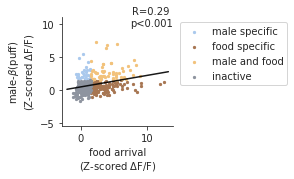

In [214]:
# Figure S3G
c1='sexualExperience'
c2='sexualExperience'
s1='male     '
s2='food     '

cols = ['sex','m','s','letter','activity','is_active','c']

corrs = {'s1':[],'s2':[],'R':[]}

q = ''


over_time = pd.merge(responsive_df.query(q+'condition=="%s" and s == "%s"'%(c1,s1))[cols],
             responsive_df.query(q+'condition=="%s" and s == "%s"'%(c2,s2))[cols],
 on=['m','c','sex'])
over_time = pd.merge(over_time,
                      responsive_df.query(q+'condition=="%s" and s == "puff"'%(c2))[cols],
 on=['m','c','sex'])

a = over_time.activity_x.values
b = over_time.activity_y.values
c = over_time.activity.values

df = pd.DataFrame({s1.replace(' ',''):a,
                  s2.replace(' ',''):b,
                  'puff':c})
mod = smf.ols(formula='%s ~ %s + puff'%(s1.replace(' ',''),s2.replace(' ','')),
              data=df)
res = mod.fit()
print(res.params)

R = res.tvalues[1]
p = res.pvalues[1]
if s1 == s2:
    R=0
    p=1



t1 = s2title[s1.replace(' ','')]
t2 = s2title[s2.replace(' ','')]

corrs['s1'].append(t1)
corrs['s2'].append(t2)
corrs['R'].append(R)

a2=a-res.params[2]*c
R,p=pearsonr(b,a2)
RTEST,pTEST=pearsonr(b,a)
print(R,RTEST,p,pTEST)
lm = linregress(x=b,y=a2)
f=plt.figure(figsize=(2,2))


plt.scatter(b[np.logical_and(a>A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b<A_THRESH)],
            color=kcols['blue'],s=5,label=t1+' specific')
plt.scatter(b[np.logical_and(a<A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b>A_THRESH)],
            color=kcols['brown'],s=5,label=t2+' specific')
plt.scatter(b[np.logical_and(a>A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b>A_THRESH)],
            color=kcols['gold'],s=5,label=t1+ ' and '+t2)
plt.scatter(b[np.logical_and(a<A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b<A_THRESH)],
            color=kcols['grey'],s=5,label='inactive')
if p<0.001:
    f.axes[0].text(0.8,1,'R=%.2f\np<0.001'%(R),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
elif p<0.05:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.2f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
else:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.3f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
plt.ylabel(r'%s-$\beta$(puff)'%(t1.replace('\n',' '))+'\n(Z-scored $\Delta$F/F)',size=10)
plt.xlabel('%s arrival\n(Z-scored $\Delta$F/F)'%(t2.replace('\n',' ')),size=10)
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',prop=dict(size=10))

print(lm,len(a))
abline(lm.slope, lm.intercept)
plt.axis('equal')
sns.despine()
plt.show()

Intercept    0.209604
food         0.101100
puff        -0.029385
dtype: float64
0.23509372280429855 0.23718198155235343 1.4407687028482391e-06 1.154175875460999e-06
LinregressResult(slope=0.10109978663596424, intercept=0.20960426828009926, rvalue=0.23509372280429866, pvalue=1.4407687028476672e-06, stderr=0.020668150795191333, intercept_stderr=0.05960170621032997) 411


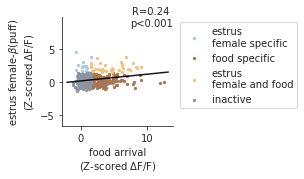

In [215]:
# Figure S3H
# Figure S3G
c1='sexualExperience'
c2='sexualExperience'
s1='female_E '
s2='food     '

cols = ['sex','m','s','letter','activity','is_active','c']

corrs = {'s1':[],'s2':[],'R':[]}

q = ''


over_time = pd.merge(responsive_df.query(q+'condition=="%s" and s == "%s"'%(c1,s1))[cols],
             responsive_df.query(q+'condition=="%s" and s == "%s"'%(c2,s2))[cols],
 on=['m','c','sex'])
over_time = pd.merge(over_time,
                      responsive_df.query(q+'condition=="%s" and s == "puff"'%(c2))[cols],
 on=['m','c','sex'])

a = over_time.activity_x.values
b = over_time.activity_y.values
c = over_time.activity.values

df = pd.DataFrame({s1.replace(' ',''):a,
                  s2.replace(' ',''):b,
                  'puff':c})
mod = smf.ols(formula='%s ~ %s + puff'%(s1.replace(' ',''),s2.replace(' ','')),
              data=df)
res = mod.fit()
print(res.params)

R = res.tvalues[1]
p = res.pvalues[1]
if s1 == s2:
    R=0
    p=1



t1 = s2title[s1.replace(' ','')]
t2 = s2title[s2.replace(' ','')]

corrs['s1'].append(t1)
corrs['s2'].append(t2)
corrs['R'].append(R)

a2=a-res.params[2]*c
R,p=pearsonr(b,a2)
RTEST,pTEST=pearsonr(b,a)
print(R,RTEST,p,pTEST)
lm = linregress(x=b,y=a2)
f=plt.figure(figsize=(2,2))


plt.scatter(b[np.logical_and(a>A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b<A_THRESH)],
            color=kcols['blue'],s=5,label=t1+' specific')
plt.scatter(b[np.logical_and(a<A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b>A_THRESH)],
            color=kcols['brown'],s=5,label=t2+' specific')
plt.scatter(b[np.logical_and(a>A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b>A_THRESH)],
            color=kcols['gold'],s=5,label=t1+ ' and '+t2)
plt.scatter(b[np.logical_and(a<A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b<A_THRESH)],
            color=kcols['grey'],s=5,label='inactive')
if p<0.001:
    f.axes[0].text(0.8,1,'R=%.2f\np<0.001'%(R),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
elif p<0.05:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.2f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
else:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.3f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
plt.ylabel(r'%s-$\beta$(puff)'%(t1.replace('\n',' '))+'\n(Z-scored $\Delta$F/F)',size=10)
plt.xlabel('%s arrival\n(Z-scored $\Delta$F/F)'%(t2.replace('\n',' ')),size=10)
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',prop=dict(size=10))

print(lm,len(a))
abline(lm.slope, lm.intercept)
plt.axis('equal')
sns.despine()
plt.show()

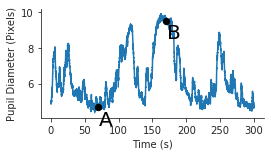

In [228]:
# Figure S3I
pupil_file = [f for f in pupil_files if '776_w1e3' in f][0]
pup = pd.read_csv(pupil_file,header=[1,2])
avgd=np.mean([np.linalg.norm(pup[a][['x','y']]-pup[b][['x','y']],axis=1) for a,b in puppairs],axis=0)
avgl=np.mean([pup[a]['likelihood'] for a in np.concatenate(puppairs)],axis=0)
avgd[avgl<0.995]=np.nan

s=120000
e=150000
t1=127000
t2=137000
i=np.arange(s,e)
t=(i-s)/100
plt.figure(figsize=(4,2))
plt.plot(t,avgd[s:e]/28)
plt.xlabel('Time (s)')
plt.ylabel('Pupil Diameter (Pixels)')
sns.despine()
for time,letter in zip([t1,t2],["A","B"]):
    x=(time-s)/100
    y=avgd[time]/28
    plt.scatter(x,y,
                color='black',
                s=40,zorder=200)
    plt.text(x+1,y-1,letter,
                color='black',
                size=20,zorder=200)

LinregressResult(slope=0.14885181535394218, intercept=0.42664658843076625, rvalue=0.26045540226195363, pvalue=8.46621215577774e-08, stderr=0.02728381136128659, intercept_stderr=0.07867959379470998) 411


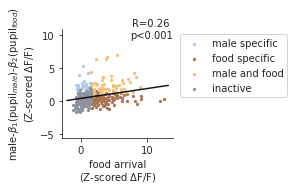

In [233]:
# Figure S3J

c1='sexualExperience'
c2='sexualExperience'
s1='male     '
s2='food     '
q = ''
cols = ['sex','m','s','letter','activity','is_active','c']
over_time = pd.merge(responsive_df.query(q+'condition=="%s" and s == "%s"'%(c1,s1))[cols],
                     responsive_df.query(q+'condition=="%s" and s == "%s"'%(c2,s2))[cols],
         on=['m','c','sex'])

p_merge = pd.merge(pupil_df.query(q+'cond=="%s" and s == "%s"'%(c1,s1)),
         pupil_df.query(q+'cond=="%s" and s == "%s"'%(c2,s2)), on=['m', 'cond'])

n_p_merge = pd.merge(over_time, p_merge, left_on=['m'], right_on=['m'])

mod = smf.ols(formula='activity_x ~ activity_y + p_x + p_y',
                      data=n_p_merge)
res = mod.fit()

a = n_p_merge.activity_x.values
b = n_p_merge.activity_y.values
c = n_p_merge.p_x.values
d = n_p_merge.p_y.values
a2=a-res.params[2]*c-res.params[3]*d
R,p=pearsonr(b,a2)
R,p

lm = linregress(x=b,y=a2)
f=plt.figure(figsize=(2,2))

t1 = s2title[s1.replace(' ','')]
t2 = s2title[s2.replace(' ','')]

plt.scatter(b[np.logical_and(a>A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b<A_THRESH)],
            color=kcols['blue'],s=5,label=t1+' specific')
plt.scatter(b[np.logical_and(a<A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b>A_THRESH)],
            color=kcols['brown'],s=5,label=t2+' specific')
plt.scatter(b[np.logical_and(a>A_THRESH,b>A_THRESH)],
            (a2)[np.logical_and(a>A_THRESH,b>A_THRESH)],
            color=kcols['gold'],s=5,label=t1+ ' and '+t2)
plt.scatter(b[np.logical_and(a<A_THRESH,b<A_THRESH)],
            (a2)[np.logical_and(a<A_THRESH,b<A_THRESH)],
            color=kcols['grey'],s=5,label='inactive')



if p<0.001:
    f.axes[0].text(0.8,1,'R=%.2f\np<0.001'%(R),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
elif p<0.05:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.2f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
else:
    f.axes[0].text(0.8,1,'R=%.2f\np=%.3f'%(R,p),
     horizontalalignment='center',
     verticalalignment='center',
     transform = f.axes[0].transAxes,size=10)
plt.ylabel(r'%s-$\beta_1$(pupil$_{male}$)-$\beta_2$(pupil$_{food}$)'%(t1.replace('\n',' '))+'\n(Z-scored $\Delta$F/F)',size=10)
plt.xlabel('%s arrival\n(Z-scored $\Delta$F/F)'%(t2.replace('\n',' ')),size=10)
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',prop=dict(size=10))

print(lm,len(a))
abline(lm.slope, lm.intercept)
plt.axis('equal')
sns.despine()

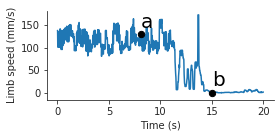

In [239]:
# Figure S3K
body_file = [f for f in body_files if '344_w2e1' in f][0]
body = pd.read_csv(body_file,header=[1,2])
velocity=np.zeros(len(body['LeftForepawTip']['x']))
velocity2=np.zeros(len(body['LeftForepawTip']['x']))
velocity[5:]=np.linalg.norm(body['LeftForepawTip'][['x','y']].values[5:]-body['LeftForepawTip'][['x','y']].values[:-5],axis=1)

s=12000
e=14000
t1=12750+63
t2=13500
i=np.arange(s,e)
t=(i-s)/100
vel=medfilt(interp_nan(velocity),21)/PIXELS_PER_MM/0.1
plt.figure(figsize=(4,2))
plt.plot(t,vel[s:e])
plt.xlabel('Time (s)')
plt.ylabel('Limb speed (mm/s)')
sns.despine()
for time,letter in zip([t1,t2],["a","b"]):
    x=(time-s)/100
    y=vel[time]
    plt.scatter(x,y,
                color='black',
                s=40,zorder=200)
    plt.text(x,y+15,letter,
                color='black',
                size=20,zorder=200)
    plt.tight_layout()

In [234]:
# Figure S3L
pupil_change_data = {'pupil':[],
                    'state':[],
                    'mouse':[],
                    'period':[],
                    'stimulus':[]}

periods2times = {'ITI':[33*100,40*100],
                'first_sec':[43*100,44*100]}

satedVhungry = {'male     ':{'sated':[],
                'hungry':[]},
               'food     ':{'sated':[],
                'hungry':[]}}

for k in running_speeds:
    m = k[0]
    order=['w1e2','w1e3']
    order_titles=['sated','hungry']
    if (m,'w1e2') in running_speeds and (m,'w1e3') in running_speeds:
        if k[1]=='w1e2':
            if md2condition[k]=='hungry':
                order= ['w1e3','w1e2']
            print(m)
            for s in ['male     ','food     ']:
                for d,t in zip(order,order_titles):
                    pup = pupil_full_z[(m,d)][s]
                    for period,times in periods2times.items():
                        pupil_change_data['mouse'].append(m)
                        pupil_change_data['state'].append(int(t=='hungry'))
                        pupil_change_data['pupil'].append(np.mean(np.mean(pup,axis=0)[times[0]:times[1]]))
                        pupil_change_data['period'].append(period)
                        pupil_change_data['stimulus'].append(s.replace(' ',''))
                    satedVhungry[s][t].append(medfilt(np.mean(pup,axis=0),11)[20*100:-20*100])


788
791
345
775n
305
775
309
776
346
344
318
350
778
771
304
716
307
773


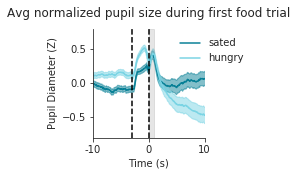

In [235]:
for s in ['food     ']:
    plt.figure(figsize=(2,2))
    for t in ['sated', 'hungry']:
        means = np.mean(20*satedVhungry[s][t],axis=0)
        sems = 2*scipy.stats.sem(20*satedVhungry[s][t],axis=0)
        plt.plot(means,label=t,color=cond2color[t])
        plt.fill_between(np.arange(len(means)),means-sems,means+sems,alpha=0.5,color=cond2color[t])
    sns.despine()
    plt.axvline(x=20*100,color='k', linestyle='--')
    plt.axvline(x=23*100,color='k', linestyle='--')
    plt.axvspan(2300, 2400, alpha=0.2, color='grey')
    plt.xticks(np.array([3,13,23,33,43,53,63])*100,np.array([-20,-10,0,10,20,30,40]))
    plt.xlabel('Time (s)')
    plt.ylabel('Pupil Diameter (Z)')
    plt.title('Avg normalized pupil size during first %s trial'%(s.replace(' ','')))
    plt.legend(bbox_to_anchor=(0.7,1), loc="upper left",frameon=False)
    plt.xlim(1300,3300)
    plt.show()
                    

788
791
345
775n
305
775
309
776
346
344
318
350
778
771
304
716
307
773


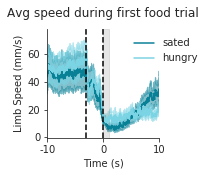

In [241]:
# Figure S3M

speed_change_data = {'speed':[],
                    'state':[],
                    'mouse':[],
                    'period':[],
                    'stimulus':[]}

periods2times = {'ITI':[33*100,40*100],
                'first_sec':[43*100,44*100]}

satedVhungry = {'male     ':{'sated':[],
                'hungry':[]},
               'food     ':{'sated':[],
                'hungry':[]}}

for k in running_speeds:
    m = k[0]
    order=['w1e2','w1e3']
    order_titles=['sated','hungry']
    if (m,'w1e2') in running_speeds and (m,'w1e3') in running_speeds:
        if k[1]=='w1e2':
            if md2condition[k]=='hungry':
                order= ['w1e3','w1e2']
            print(m)
            for s in ['male     ','food     ']:
                for d,t in zip(order,order_titles):
                    for period,times in periods2times.items():
                        speed_change_data['mouse'].append(m)
                        speed_change_data['state'].append(int(t=='hungry'))
                        speed_change_data['speed'].append(20*np.mean(np.mean(running_speeds_full[(m,d)][s],axis=0)[times[0]:times[1]]))
                        speed_change_data['period'].append(period)
                        speed_change_data['stimulus'].append(s.replace(' ',''))
                    satedVhungry[s][t].append(medfilt(np.mean(running_speeds_full[(m,d)][s],axis=0),11)[20*100:-20*100])

for s in ['food     ']:
    plt.figure(figsize=(2,2))
    for t in ['sated', 'hungry']:
        means = np.mean(satedVhungry[s][t],axis=0)/PIXELS_PER_MM/0.1
        sems = scipy.stats.sem(satedVhungry[s][t],axis=0)/PIXELS_PER_MM/0.1
        plt.plot(means,label=t,color=cond2color[t])
        plt.fill_between(np.arange(len(means)),means-sems,means+sems,alpha=0.5,color=cond2color[t])
    sns.despine()
    plt.axvline(x=20*100,color='k',linestyle='--')
    plt.axvline(x=23*100,color='k', linestyle='--')
    plt.axvspan(2300, 2400, alpha=0.2, color='grey')
    plt.xticks(np.array([3,13,23,33,43,53,63])*100,np.array([-20,-10,0,10,20,30,40]))
    plt.xlabel('Time (s)')
    plt.ylabel('Limb Speed (mm/s)')
    plt.title('Avg speed during first %s trial'%(s.replace(' ','')))
    plt.legend(bbox_to_anchor=(0.7,1), loc="upper left",frameon=False)
    plt.xlim(1300,3300)
    plt.show()
                    

Ttest_indResult(statistic=0.33005446412707445, pvalue=0.7432718360699415)
20 18


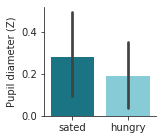

Ttest_indResult(statistic=-1.5754922229003412, pvalue=0.12389118677200285)
20 18


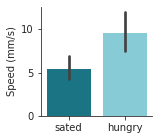

In [245]:
# Figure S3N,O
for behave,ylab in zip(['pupilz_m','speed_m'],
                       ['Pupil diameter (Z)',
                       'Speed (mm/s)']):
    plt.figure(figsize=(2,2))
    sns.barplot(data=before_after_df,x='condition',y=behave,
                ci=68,#hue_order=['sated','hungry'],
                order=['sated','hungry'],
               palette=[cond2color[c] for c in ['sated','hungry']])
    sns.despine()
    plt.xlabel('')
    plt.ylabel(ylab)
    if behave != "eyedist_m":
        print(ttest_ind(before_after_df.query('condition=="sated"')[behave].dropna(),
                  before_after_df.query('condition=="hungry"')[behave].dropna()))
        print(len(before_after_df.query('condition=="sated"')[behave].dropna()),
                  len(before_after_df.query('condition=="hungry"')[behave].dropna()))
    plt.show()

Ttest_indResult(statistic=-0.16340878993397287, pvalue=0.8711932439611313)
16 19


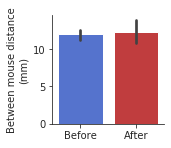

Ttest_indResult(statistic=-0.26073528955458597, pvalue=0.7958694167299611)
16 20


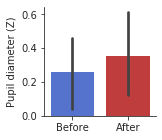

Ttest_indResult(statistic=-0.48712205891649196, pvalue=0.6292977553784578)
16 20


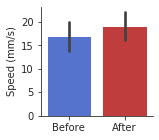

In [247]:
# Figure S3P, Q
for behave,ylab in zip(['eyedist_m','pupilz_m','speed_m'],
                       ['Between mouse distance\n(mm)',
                       'Pupil diameter (Z)',
                       'Speed (mm/s)']):
    plt.figure(figsize=(2,2))
    sns.barplot(data=before_after_df,x='condition', y=behave,
                ci=68,#hue_order=['baseline','sexualExperience'],
                order =['baseline','sexualExperience'],
                palette=[cond2color[c] for c in ['baseline','sexualExperience']])
    sns.despine()
    plt.xlabel('')
    plt.xticks([0,1],['Before','After'])
    plt.ylabel(ylab)
    print(ttest_ind(before_after_df.query('condition=="baseline"')[behave].dropna(),
                  before_after_df.query('condition=="sexualExperience"')[behave].dropna()))
    print(len(before_after_df.query('condition=="baseline"')[behave].dropna()),
              len(before_after_df.query('condition=="sexualExperience"')[behave].dropna()))
    plt.show()

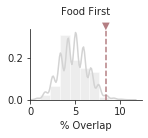

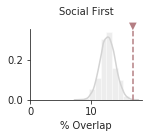

0.3220338983050847 0.5221843003412969


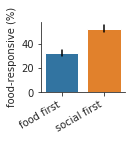

0.15254237288135594 0.24232081911262798


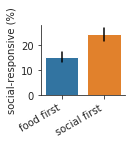

food (10.135178851631723, 3.856671572305358e-24)
male (6.100304026982743, 1.0586690695417006e-09)


In [261]:
# Figure S3R,S
md2trials = pickle.load(open('md2trials.p','rb'))
trial_position = []
for m,d,s in responsive_df[['m','d','s']].values:
    if s == "puff":
        trial_position.append(-1)
    else:
        trial_position.append(np.where(np.array(md2trials[(m,d)])==s.replace(' ',''))[0][0])

responsive_df['trial_position']=trial_position
        
a = responsive_df.query('condition=="sexualExperience" and s == "food     "')
b = responsive_df.query('condition=="sexualExperience" and s == "male     "')

history_dict = {'order':[],'overlap':[],'social':[],'food':[]}


food_first_food_active = a.iloc[a.trial_position.values < b.trial_position.values].activity.values>1.5
food_first_male_active = b.iloc[a.trial_position.values < b.trial_position.values].activity.values>1.5
c = np.sum(food_first_food_active & food_first_male_active)
n = len(food_first_food_active)
history_dict['order'].append('food first')
history_dict['overlap'].append(c/n*100)
history_dict['food'].append(np.sum(food_first_food_active) / n*100)
history_dict['social'].append(np.sum(food_first_male_active) / n*100)
make_overlap_plot(c,
                  n,
                 np.sum(food_first_food_active),
                 np.sum(food_first_male_active),
                  "#B47E83",
                  'Food First',
                 )

male_first_food_active = a.iloc[a.trial_position.values > b.trial_position.values].activity.values>1.5
male_first_male_active = b.iloc[a.trial_position.values > b.trial_position.values].activity.values>1.5
c = np.sum(male_first_food_active & male_first_male_active)
n = len(male_first_food_active)
history_dict['order'].append('social first')
history_dict['overlap'].append(c/n*100)
history_dict['food'].append(np.sum(male_first_food_active) / n*100)
history_dict['social'].append(np.sum(male_first_male_active) / n*100)
make_overlap_plot(c,
                  n,
                 np.sum(male_first_food_active),
                 np.sum(male_first_male_active),
                  "#B47E83",
                  'Social First',
                 )
history_df = pd.DataFrame(history_dict)
for y_plot in ['food','social']:
    plt.figure(figsize=(1.5,1.3))
    sns.barplot(data=history_df,x='order',y=y_plot,
                order=['food first','social first'])
    nob1=n
    nob2=n
    p1 = history_df.query('order=="food first"')[y_plot].values[0]/100
    ci1 = np.sqrt(nob1*(p1)*(1-p1))/nob1*100 #square root (n*p*(1-p))
    p2 = history_df.query('order=="social first"')[y_plot].values[0]/100
    print(p1,p2)
    ci2 = np.sqrt(nob2*(p2)*(1-p2))/nob2*100
    plt.plot([0,0],[p1*100-ci1,p1*100+ci1],color='k')
    plt.plot([1,1],[p2*100-ci2,p2*100+ci2],color='k')
    plt.xlabel('')
    plt.ylabel(f'{y_plot}-responsive (%)')
    plt.xticks(rotation=30,ha='right')
    sns.despine()
    if y_plot=="overlap":
        plt.plot([0,1],[15,15],c='k',linewidth=0.75)
        plt.text(0.5,15,'*',ha='center')
        plt.plot([0,2],[18,18],c='k',linewidth=0.75)
        plt.text(1,19,'p=0.14',ha='center')
        plt.ylabel(f'{y_plot} (%)')
    plt.show()
    
    
print('food',
      proportions_ztest([np.sum(male_first_food_active),np.sum(food_first_food_active)],[n,n]))
print('male',
      proportions_ztest([np.sum(male_first_male_active),np.sum(food_first_male_active)],[n,n]))


FOOD 9


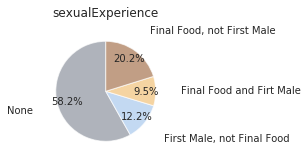

0.0012 0.9995


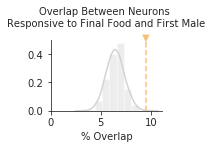

In [262]:
# Figure S3T,U
s2title={'male':'male',
        'female_E':'estrus\nfemale',
         'female_NE':'non-estrus\nfemale',
        'object':'empty',
        'food':'food'}

overlap_sig = []
food_t = 9

social_stim = "male     "
cond="sexualExperience"
trial=0

q='m!= "779" and condition=="%s" and s =="%s" and trial ==%d'%(cond,social_stim,trial)
male_activity = first_trial_df.query(q)[['m','d','c','first_sec']]
male_all = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q)[['m','d','c']].values])
male_responsive = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q+' and first_sec>1.5')[['m','d','c']].values])

trial=food_t
print('FOOD %d'%food_t)
stim = "food     "
q='m!= "779" and condition=="%s" and s =="%s" and trial ==%d'%(cond,stim,trial)
food_all = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q)[['m','d','c']].values])
food_activity = first_trial_df.query(q)[['m','d','c','first_sec']]
food_responsive = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q+' and first_sec>1.5')[['m','d','c']].values])

trial=0
stim = "object   "
q='m!= "779" and condition=="%s" and s =="%s" and trial ==%d'%(cond,stim,trial)
obj_all = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q)[['m','d','c']].values])
obj_activity = first_trial_df.query(q)[['m','d','c','first_sec']]
obj_responsive = set([(r[0],r[1],r[2]) for r in first_trial_df.query(q+' and first_sec>1.5')[['m','d','c']].values])

nnone=len(male_all-food_responsive-male_responsive)
ns=len(male_responsive)
no=len(male_responsive.intersection(food_responsive))
nf=len(food_responsive)

kcols={
'brown':"#A77652", 
    'gold':"#F2C27B",
    'blue':"#AAC9ED",
    'grey':"#8E949F"
}
cols=[kcols[i] for i in ['grey','blue','gold','brown']]

plt.figure(figsize=(2.3,2.3))
plt.pie([nnone,ns-no,no,(nf-no)],
colors=cols,
labels=['None','First Male, not Final Food','Final Food and Firt Male','Final Food, not First Male'],
autopct='%1.1f%%',startangle=90,
labeldistance=1.5,pctdistance=0.8,
wedgeprops={'alpha':0.7})
plt.title(cond)
plt.show()

noverlap=no
ntotal=len(male_all)
nfood=nf
nsocial=ns
overlaps=[]
from random import sample
for i in range(10000):
    foodns=set(sample(range(ntotal),nfood))
    socialns=set(sample(range(ntotal),nsocial))
    overlaps.append(len(foodns.intersection(socialns))/ntotal*100)

f=plt.figure(figsize=(2,1.3))
sns.distplot(overlaps,bins=10,color='lightgrey')
plt.axvline(x=noverlap/ntotal*100,color=kcols['gold'],linestyle='--')
plt.text(noverlap/ntotal*100,f.axes[0].get_ylim()[1],'▼',
         color=kcols['gold'],ha='center')
p=np.sum(np.array(overlaps)>=noverlap/ntotal*100)/10000
p_lt=np.sum(np.array(overlaps)<=noverlap/ntotal*100)/10000
xmin,xmax=plt.xlim()
plt.xlim((0,xmax))
plt.xlabel('% Overlap',size=10)
plt.rcParams['axes.titlepad'] = 12
plt.title('Overlap Between Neurons \nResponsive to Final Food and First Male',size=10,va='bottom')
sns.despine()
print(p,p_lt)
plt.show()


## Figure S4

In [50]:
ap_ml_dv = pd.read_csv('../../zstacks/AP_ML_DV_cell_centers.csv')
response_anatomy=pd.merge(responsive_df,ap_ml_dv,left_on=['mouse','day','cell'],right_on=['m','d','c'])

0.025431314526413215 0.6032603900595467 420
0.06808369626402677 0.1636927734965531 420
0.022413003365741903 0.9296588010705727 420


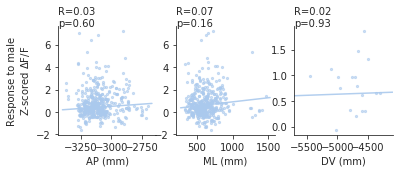

-0.09267521885613655 0.0577353214394358 420
-0.009989592563304846 0.8382591935147026 420
0.06862215717412382 0.7867321756143155 420


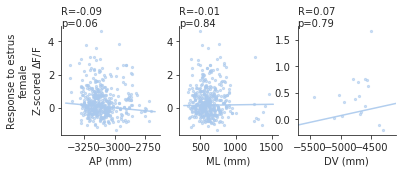

0.2760262537138487 8.813024974574818e-09 420
0.12311376333040439 0.011564070458853173 420
-0.2280017011199869 0.3628482567968769 420


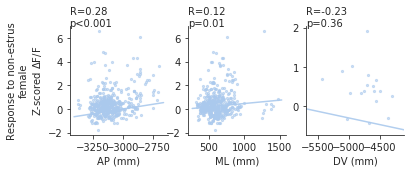

-0.07456690955854467 0.12707530665065098 420
0.0036660048654582646 0.9402886400350348 420
-0.42023884489637053 0.08249749311810317 420


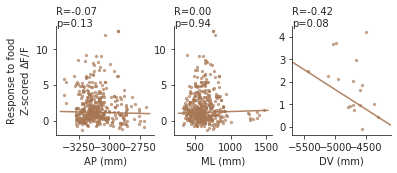

-0.010592837503467024 0.8286388206488915 420
0.00983235130044527 0.8407708553616766 420
-0.00615046970163427 0.9806763772691288 420


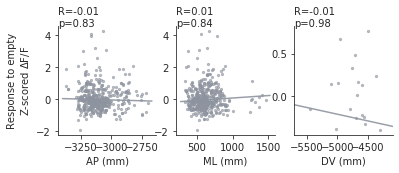

In [42]:
stim2col={'male     ':'blue', 'female_E ':'blue',
          'female_NE':'blue','food     ':'brown',
          'object   ':'grey'}
for stim in STIMULI:
    dsub=response_anatomy.query('condition=="sexualExperience" and stimulus=="%s"'%stim)

    b=dsub.activity.values

    fig,axs=plt.subplots(nrows=1,ncols=3,figsize=(6,2))
    for i,lab in enumerate(['AP','ML','DV']):
        a=dsub[lab].values
        if lab=="ML":
            a=np.abs(a)
            axs[i].scatter(a,b,s=5,c=kcols[stim2col[stim]],alpha=0.6)
            axs[i].set_xlabel(lab+' (mm)')
            lm = TheilSenRegressor()
            lm.fit(a.reshape(-1,1),b)
            abline(lm.coef_[0],lm.intercept_,color=kcols[stim2col[stim]],ax=axs[i])
            R,p=pearsonr(a,b)
        elif lab=="DV":
            b_fov=[]
            a_fov=[]
            for aval in set(a):
                a_fov.append(aval)
                b_fov.append(b[a==aval].mean())
            lm = TheilSenRegressor()
            axs[i].set_xlim(-5700,-4100)
            lm.fit(np.array(a_fov).reshape(-1,1),b_fov)
            abline(lm.coef_[0],lm.intercept_,color=kcols[stim2col[stim]],ax=axs[i])
            axs[i].scatter(a_fov,b_fov,s=5,c=kcols[stim2col[stim]],alpha=0.6)
            axs[i].set_xlabel(lab+' (mm)')
            R,p=pearsonr(a_fov,b_fov)
        else:
            axs[i].scatter(a,b,s=5,c=kcols[stim2col[stim]],alpha=0.6)
            axs[i].set_xlabel(lab+' (mm)')
            lm = TheilSenRegressor()
            lm.fit(a.reshape(-1,1),b)
            abline(lm.coef_[0],lm.intercept_,color=kcols[stim2col[stim]],ax=axs[i])
            R,p=pearsonr(a,b)
        print(R,p,len(a))
        sns.despine()
        xlims=axs[i].get_xlim()
        ylims=axs[i].get_ylim()
        if p>0.001:
            axs[i].text(xlims[0],ylims[1],'R=%.2f\np=%.2f'%(R,p))
        else:
            axs[i].text(xlims[0],ylims[1],'R=%.2f\np<0.001'%(R))
    axs[0].set_ylabel('Response to %s\nZ-scored $\Delta$F/F'%s2title[stim.replace(' ','')])
    plt.show()


## Figure S5

0.14899140708351846
[0.70315319]
0.5709587268401647 3.219933196879967e-13 137


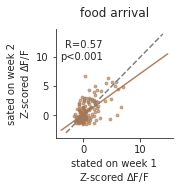

0.7433119813470447 0.4585749569335331


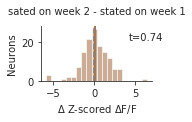

0.9644559685293732
[0.71892836]
0.6802772910498917 6.096793445044044e-20 137


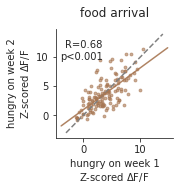

0.15246225218151538 0.8790483178337155


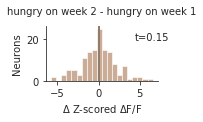

In [264]:
# Figure S5B, C
cond2title={'baseline':'before',
 'sated': 'stated on week 1',
 'hungry': 'hungry on week 1',
 'sexualExperience': 'after',
 'sexualExperience_hungry': 'hungry on week 2',
 'sexualExperience_sated': 'sated on week 2'}

    
    
diff_dfs=[]
q=''
stim="food     "
sub_df=first_trial_df.query(q+'condition!="initial" and trial==0 and s in %s and letter!="-"'%[stim])
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==6])

rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])



rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])

X=[sub_df_in_all.query('condition=="%s"'%cond).first_sec.values for cond in CONDITIONS[1:]]
corr_X=np.corrcoef(X)
stars=np.zeros((len(CONDITIONS[1:-1]),len(CONDITIONS[1:]))).astype('str')
diff_df=pd.DataFrame(data=np.array(X).T,columns=CONDITIONS[1:])
diff_df['m']=sub_df_in_all.query('condition=="baseline"').m.values
diff_df['letter']=sub_df_in_all.query('condition=="baseline"').letter.values
diff_df['stimulus']=stim
diff_dfs.append(diff_df)

for c1,c2 in [['sated','sexualExperience_sated'],
              ['hungry','sexualExperience_hungry']]:

    a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
    b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

    lm = TheilSenRegressor()

    lm.fit(a.reshape(-1,1),b)
    print(lm.intercept_)
    print(lm.coef_)
    f=plt.figure(figsize=(2.1,2.))
    plt.scatter(a,b,s=8,c=kcols['brown'],alpha=0.6)
    R,p=scipy.stats.pearsonr(a,b)
    plt.text(0.4,0.8,'R=%.2f\np<0.001'%(R),ha='right',
             horizontalalignment='center',
             verticalalignment='center',
             transform = f.axes[0].transAxes)
    print(R,p,len(a))
    plt.title('')
    sns.despine()
    plt.xlabel(cond2title[c1]+'\nZ-scored $\Delta$F/F')
    plt.ylabel(cond2title[c2]+'\nZ-scored $\Delta$F/F')
    plt.title('%s arrival'%(s2title[stim.replace(' ','')]))
    plt.plot([-3,14],[-3,14],color='grey',linestyle='--')
    abline(lm.coef_[0], lm.intercept_,kcols['brown'])
    plt.show()

    f=plt.figure(figsize=(2,1))
    plt.hist(b-a,bins=20,alpha=0.6,color=kcols['brown'])
    t,p=ttest_1samp(b-a,0)
    plt.title('%s - %s'%(cond2title[c2],cond2title[c1]),size=10)
    plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
             horizontalalignment='center',
             verticalalignment='center',
             transform = f.axes[0].transAxes)
    print(t,p)
    plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
    plt.ylabel('Neurons')
    sns.despine()
    plt.axvline(x=np.mean(b-a),color=kcols['brown'],linewidth=2)
    plt.axvline(0,linestyle='--',color='grey')
    plt.show()

In [45]:
# Figure S5D
diff_dfs=[]
for stim in STIMULI:
    sub_df=first_trial_df.query('condition!="initial" and trial==0 and s in %s and letter!="-"'%[stim])
    cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                         sub_df.letter.values)])).items() if count==6])

    rows_in_all=[]
    for r in sub_df.iterrows():
        if (r[1]['m'],r[1]['letter']) in cells_in_all:
            rows_in_all.append(r[0])
    sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])


    
    rows_in_all=[]
    for r in sub_df.iterrows():
        if (r[1]['m'],r[1]['letter']) in cells_in_all:
            rows_in_all.append(r[0])
    sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])
    
    X=[sub_df_in_all.query('condition=="%s"'%cond).first_sec.values for cond in CONDITIONS[1:]]
    corr_X=np.corrcoef(X)
    stars=np.zeros((len(CONDITIONS[1:-1]),len(CONDITIONS[1:]))).astype('str')
    diff_df=pd.DataFrame(data=np.array(X).T,columns=CONDITIONS[1:])
    diff_df['m']=sub_df_in_all.query('condition=="baseline"').m.values
    diff_df['letter']=sub_df_in_all.query('condition=="baseline"').letter.values
    diff_df['stimulus']=stim
    diff_dfs.append(diff_df)

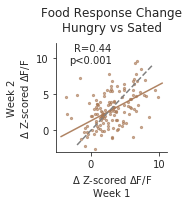

0.43589271772695776 1.015384069674997e-07 137


In [46]:
diffs_df = pd.concat(diff_dfs)
a = diffs_df.query('stimulus=="food     "')['sexualExperience_hungry'].values - diffs_df.query('stimulus=="food     "')['sexualExperience_sated'].values
b = diffs_df.query('stimulus=="food     "')['hungry'].values - diffs_df.query('stimulus=="food     "')['sated'].values
R,p=pearsonr(a,b)
f=plt.figure(figsize=(2,2))
plt.title('Food Response Change\nHungry vs Sated')
plt.scatter(b,a,s=5,c=kcols['brown'],alpha=0.6)

plt.xlabel('$\Delta$ Z-scored $\Delta$F/F\nWeek 1')
plt.ylabel('Week 2\n$\Delta$ Z-scored $\Delta$F/F')
lm = TheilSenRegressor()
lm.fit(a.reshape(-1,1),b)
abline(lm.coef_[0],lm.intercept_,color=kcols['brown'])
sns.despine()
plt.ylim(-3,12)
plt.plot([-2,9],[-2,9],color='grey',linestyle='--')
plt.text(0.5,0.9,'R=%.2f\np<0.001'%(R),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
plt.show()
print(R,p,len(a))

0.0004782473531410071 2.9868726765799405
-0.13341205488708768 0.3730519296859326
-0.7835285104557825 0.012987096251121441


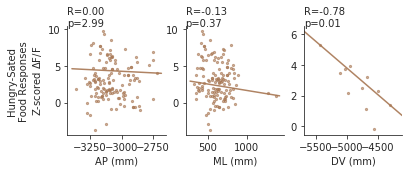

In [272]:
# Figure S5E

sub_ra= response_anatomy.query('condition=="sexualExperience" and stimulus=="food     "')[['mouse','cell','ML','DV','AP','letter','sex']]
ra_diff=pd.merge(sub_ra,diffs_df,left_on=['mouse','letter'],right_on=['m','letter']).query('stimulus=="food     "')

fig,axs=plt.subplots(nrows=1,ncols=3,figsize=(6,2))
for i,lab in enumerate(['AP','ML','DV']):
    a=ra_diff[lab].values
    b=ra_diff['hungry'].values-ra_diff['sated'].values
    if lab=="ML":
        a=np.abs(a)
        axs[i].scatter(a,b,s=5,c=kcols['brown'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        lm = TheilSenRegressor()
        lm.fit(a.reshape(-1,1),b)
        abline(lm.coef_[0],lm.intercept_,color=kcols['brown'],ax=axs[i])
        R,p=pearsonr(a,b)
    elif lab=="DV":
        b_fov=[]
        a_fov=[]
        for aval in set(a):
            a_fov.append(aval)
            b_fov.append(b[a==aval].mean())
        lm = TheilSenRegressor()
        axs[i].set_xlim(-5700,-4100)
        lm.fit(np.array(a_fov).reshape(-1,1),b_fov)
        abline(lm.coef_[0],lm.intercept_,color=kcols['brown'],ax=axs[i])
        axs[i].scatter(a_fov,b_fov,s=5,c=kcols['brown'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        R,p=pearsonr(a_fov,b_fov)
    else:
        axs[i].scatter(a,b,s=5,c=kcols['brown'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        lm = TheilSenRegressor()
        lm.fit(a.reshape(-1,1),b)
        abline(lm.coef_[0],lm.intercept_,color=kcols['brown'],ax=axs[i])
        R,p=pearsonr(a,b)
    print(R,p*3)
    sns.despine()
    xlims=axs[i].get_xlim()
    ylims=axs[i].get_ylim()
    if p*3>0.001:
        axs[i].text(xlims[0],ylims[1],'R=%.2f\np=%.2f'%(R,p*3))
    else:
        axs[i].text(xlims[0],ylims[1],'R=%.2f\np<0.001'%(R))
axs[0].set_ylabel('Hungry-Sated\nFood Responses\nZ-scored $\Delta$F/F')
plt.show()

## Figure S6

In [314]:
# Figure S6A

import pyabf

usv_fs=250000

# Syllable count summary.
q2='(m not in %s)  '%cohort1
usv_count_df= pd.read_csv('usv_count.csv').query(q2)
usv_count_df['sex']=[mouse2sex[m] for m in usv_count_df.m]

# Timing between USV and imaging.
md2offsets = pickle.load( open( "usvs/abf2usv_motor_offsets2.p", "rb" ) )


# MUPPET syllable annotations
putative_syllables=[43,49,50,51,52,53,54,55,58]
putative_syllables2=[8,28,33,35,36,38,39,40,41,42,43,44,45]

syllable_list=pd.read_csv('../repertoires/CSV/march2020_milk_mates_N60+_syllable_sequence.csv')
syllable_list2=pd.read_csv('../../August2020_milk_or_mates/usv/repertoires/CSV/w0-2_only_N60+_syllable_sequence.csv')

syllable_list_filt = syllable_list[syllable_list['repertoire unit (RU) number'].isin(putative_syllables)]
syllable_list_filt2 = syllable_list2[syllable_list2['repertoire unit (RU) number'].isin(putative_syllables2)]

syllable_list_filt['mouse'] = [f.split('_')[0][4:] for f in syllable_list_filt['repertoire file']]
syllable_list_filt['day'] = [f.split('_')[1].split('0')[0] for f in syllable_list_filt['repertoire file']]
syllable_list_filt2['mouse'] = [f.split('_')[0] for f in syllable_list_filt2['repertoire file']]
syllable_list_filt2['day'] = [f.split('_')[1] for f in syllable_list_filt2['repertoire file']]
syllable_list_filt2['RU'] = syllable_list_filt2['repertoire unit (RU) number']
syllable_list_filt['RU'] = syllable_list_filt['repertoire unit (RU) number']
## adjust start times from per file to per trial
syllable_list_filt['file_index']=0
for (m,d),g in syllable_list_filt.groupby(['mouse','day']):
    files=np.unique(g['repertoire file'].values)
    if len(files) > 1:
        for i,f in enumerate(files[1:]):
            syllable_list_filt.loc[(syllable_list_filt['repertoire file'] == f),'file_index']=i+1
syllable_list_filt2['file_index']=0
for (m,d),g in syllable_list_filt2.groupby(['mouse','day']):
    files=np.unique(g['repertoire file'].values)
    if len(files) > 1:
        for i,f in enumerate(files[1:]):
            syllable_list_filt2.loc[(syllable_list_filt2['repertoire file'] == f),'file_index']=i+1

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,

In [290]:
def read_usv(usv_files):
    usv_data = np.array((0,2))
    lens=[]
    FSs=[]
    for u in sorted(usv_files):
        usv=wavfile.read(u)
        if len(usv[1].shape)==1:
            usv_data=np.vstack([usv_data,np.array([usv[1],usv[1]]).T])
        else:
            usv_data=np.vstack([usv_data,usv[1]])
        lens.append(usv[1].shape[0])
        print(u)
        FSs.append(usv[0])
    return (usv_data,lens,FSs)


trial_file='../../cleaned_data/usv/202097_13-11-58_776.mat'
abf_file='../../cleaned_data/usv/2020_09_07_m776_w2e1_0000.abf'
usv_files=glob.glob('../../cleaned_data/usv/*.wav')

tw,lens,Fsw=read_usv(usv_files)
test=tw[:,0][::5]

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:6: WavFileWarning:

Chunk (non-data) not understood, skipping it.



../../cleaned_data/usv/T0000057.wav
../../cleaned_data/usv/T0000058.wav
../../cleaned_data/usv/T0000059.wav


In [291]:
freqs, times, Sxx = signal.spectrogram(test, fs=Fsw[0])

In [316]:
m='776'
d='w2e1'
query_str='mouse=="%s" and day=="%s"'%(m,d)
syllables=syllable_list_filt2.query(query_str)['syllable start time (sec)'].values

In [300]:
freqs, times, Sxx = signal.spectrogram(tw[int(Fsw[0]*syllables[2]):int(Fsw[0]*syllables[100]),0], 
                                       Fsw[0])

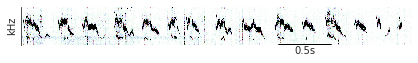

In [304]:
fpb=(freqs[75]-freqs[25])/50
usv_range=np.arange(usv_fs, usv_fs*5, usv_fs)
yticks=usv_range/fpb-25

plt.figure(figsize=(7,0.7))
plt.imshow(Sxx[25:-20,20000:24000],aspect='auto',vmin=0,vmax=40,cmap='cubehelix_r',origin='lower')
sns.despine(bottom=True)
plt.xticks([])
plt.ylabel('kHz')
plt.yticks(yticks,(usv_range/1000).astype(int))
time_lab=5
plt.plot([10/times[10]/2*time_lab,10/times[10]/2*(time_lab+1)],[0,0],color='k',linewidth=2)
plt.text(10/times[10]/2*(time_lab+0.5),-2,'0.5s',ha='center',va='top')
plt.show()

In [326]:
loadmat(trial_file)['trial_types'][0]

array([5, 1, 1, ..., 3, 1, 5], dtype=uint8)

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:6: WavFileWarning:

Chunk (non-data) not understood, skipping it.



../../cleaned_data/usv/T0000057.wav
../../cleaned_data/usv/T0000058.wav
../../cleaned_data/usv/T0000059.wav


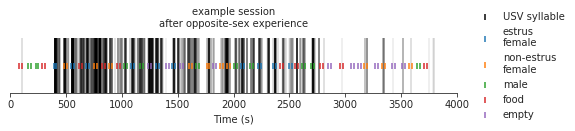

male 0
0
male 0
0
male 27
27
male 22
49
male 8
57
male 20
77
male 18
95
male 16
111
male 46
157
male 0
157


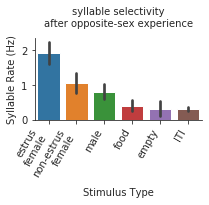

In [327]:
# Figure S5B
types={1:'male',2:'female_E',3:'female_NE',5:'food',4:'object'}

m='776'
d='w2e1'

abf = pyabf.ABF(abf_file)
abf_fs = abf.dataRate
tw,lens,Fsw=read_usv(usv_files)
del tw # Takes a lot of space

trials=[types[t] for t in loadmat(trial_file)['trial_types'][0]]

motor_starts=find_trigger(abf.data[4],3,0.2,abf_fs)

trial_starts=motor_starts[np.arange(0,100,2)]
trial_ends=motor_starts[np.arange(1,100,2)]

query_str='mouse=="%s" and day=="%s"'%(m,d)
syllables=syllable_list_filt2.query(query_str)['syllable start time (sec)'].values
RUs=syllable_list_filt2.query(query_str)['RU'].values
file_indices=syllable_list_filt2.query(query_str)['file_index'].values
syllables_corrected=np.array([s+np.sum(lens[:i])/usv_fs for s,i in zip(syllables,file_indices)])

offset=md2offsets[(m,d)][0]
plt.subplots(figsize=(8,1))
for s in syllables_corrected+offset:
    plt.axvline(s,alpha=0.6,linewidth=0.2,color='k')

plt.scatter([-100],[0],marker='|',label='USV syllable',color='k')
ttypes=['estrus\nfemale','non-estrus\nfemale','male',
            'food','empty']
for j,ttype in enumerate(['female_E', 'female_NE', 'male', 'food', 'object']):
    plt.scatter((np.append(trial_starts/abf_fs-3,trial_ends/abf_fs))[np.array(trials+trials)==ttype],
                    np.zeros(len(trials)*2)[np.array(trials+trials)==ttype],
#                     color=trials+trials,
                  marker='|',
                    label=ttypes[j],
                   zorder=100)


plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5),title='',
          frameon=False)
plt.yticks([])
sns.despine(left=True)
plt.xlim(0,4000)

plt.xlabel('Time (s)')
plt.title('example session\nafter opposite-sex experience',size=10)
plt.show()

callperstim_dict={'stimulus':[],'ncalls':[]}
calltimes=syllables_corrected+offset
prev=0
female_calls = 0
for t,s in zip(trials,trial_starts/abf_fs-3):
    ncalls=np.sum(np.logical_and(calltimes<s+23,calltimes>s+3))
    callperstim_dict['stimulus'].append(t)
    callperstim_dict['ncalls'].append(ncalls/(20))
    if t=="male":
        print(t,ncalls)
        female_calls+=ncalls
        print(female_calls)
    ncalls=np.sum(np.logical_and(calltimes<s-3,calltimes>prev+3))
    callperstim_dict['stimulus'].append('ITI')
    callperstim_dict['ncalls'].append(ncalls/((s-3)-(prev+3)))
    prev=s+23


callperstim_df=pd.DataFrame(callperstim_dict)
plt.figure(figsize=(3,1.5))
sns.barplot(data=callperstim_df,x='stimulus',y='ncalls',ci=68,
            order=['female_E','female_NE','male','food','object','ITI'])
plt.xticks(range(6),
           ['estrus\nfemale','non-estrus\nfemale','male',
            'food','empty','ITI'],
          rotation=60,ha='right')
sns.despine()
plt.xlabel('Stimulus Type')
plt.title("syllable selectivity\nafter opposite-sex experience",size=10)
plt.ylabel('Syllable Rate (Hz)')
plt.show()

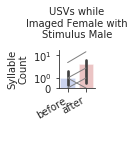

In [330]:
# Figure S5D
md2femalecalls={('307', 'w1e1'): 6,
 ('775', 'w2e1'): 2,
 ('309', 'w1e1'): 2,
 ('776', 'w2e1'): 590,
 ('773', 'w2e1'): 59,
 ('776', 'w1e1'): 0,
 ('307', 'w2e1'): 7,
 ('773', 'w1e1'): 23,
 ('309', 'w2e1'): 3,
 ('775', 'w1e1'): 1,
 ('304', 'w0e1'): 0,
 ('318', 'w0e1'): 0,
 ('305', 'w0e1'): 0,
 ('779', 'w0e1'): 0,
 ('778', 'w0e1'): 0,
 ('779', 'w1e1'): 0,
 ('778', 'w2e1'): 0,
 ('304', 'w2e1'): 16,
 ('778', 'w1e1'): 0,
 ('304', 'w1e1'): 4,
 ('779', 'w2e1'): 0,
 ('318', 'w2e1'): 1,
 ('318', 'w1e1'): 0,
 ('305', 'w2e1'): 0,
 ('305', 'w1e1'): 1}
mds=md2femalecalls.keys()

mdcalls=pd.DataFrame({'m':[md[0] for md in mds],
                     'd':[md[1] for md in mds],
                     'c':[md2femalecalls[md] for md in mds],
                    'sex':[mouse2sex[md[0]] for   md in mds]}).sort_values(['m','d'])

order=['w1e1','w2e1']
pal=['royalblue','tab:red']
usv_count_df['c_log']=np.log(usv_count_df['c'])
import seaborn as sns
plt.figure(figsize=(0.65,0.7))
sns.barplot(data=mdcalls.query('sex=="F"and d!="w0e1"'),x='d',y='c',order=order,ci=68,alpha=0.3,palette=pal)
# sns.swarmplot(data=mdcalls,x='d',y='c',order=order,palette=pal)
for m,dat in mdcalls.query('sex=="F" and d!="w0e1"').groupby('m'):
    plt.plot([0,1],dat.c.values,color='grey',linewidth=1)
plt.yscale('symlog')
sns.despine()
plt.xticks([0,1],
           ['before','after'],
          rotation=30,ha='right',size=10)
plt.title('USVs while\nImaged Female with\nStimulus Male',size=10)
plt.xlabel(' ',size=10)
plt.ylabel('Syllable\nCount',size=10)
plt.show()

3.5189504696452025 0.0005897253167243783 137


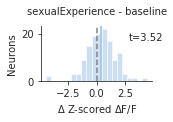

In [332]:
# Figure S5E
stim="opposite"

q2='(m not in %s) and '%cohort1
q=q2+ '((sex=="M" and s=="female_E ") or (sex=="F" and s=="male     ")) and '
sub_df=first_trial_df.query(q+'condition!="initial" and trial==0 and letter!="-"')
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==6])

c1='baseline'
c2='sexualExperience'

    
rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m', 'letter'])


a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

f=plt.figure(figsize=(2,1))
plt.hist(b-a,bins=20,alpha=0.6,color=kcols['blue'])
t,p=ttest_1samp(b-a,0)
plt.title('%s - %s'%(c2,c1),size=10)
plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(t,p,len(a))
plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
plt.ylabel('Neurons')
sns.despine()
plt.axvline(x=np.mean(b-a),color=kcols['blue'],linewidth=2)
plt.axvline(0,linestyle='--',color='grey')
plt.show()

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:119: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:120: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:121: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

initial 43 52 16 81 160
baseline 25 87 18 93 187
sated 30 56 19 118 185
hungry 40 147 40 12 159
sexualExperience 31 86 21 71 167
sexualExperience_hungry 30 152 29 24 177
sexualExperience_sated 15 75 8 114 196
overlap baseline 1 baseline 2 food -0.39224044969169036 0.6948805593479358 69.0 187.0 65.0 167.0
overlap baseline 1 baseline 2 male -0.9495586995132396 0.3423365323899886 7.0 187.0 10.0 167.0
overlap baseline 1 baseline 2 mixed -0.8748789916683395 0.38163975103367365 18.0 187.0 21.0 167.0


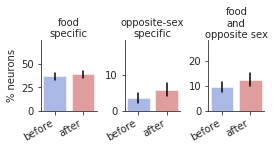

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:119: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:120: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:121: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

initial 12 21 5 56 84
baseline 9 75 8 58 134
sated 9 22 4 114 141
hungry 16 85 12 35 124
sexualExperience 26 70 21 64 139
sexualExperience_hungry 26 100 22 38 142
sexualExperience_sated 24 16 8 111 143
overlap baseline 1 baseline 2 food 2.4712168367772684 0.013465414355194187 67.0 134.0 49.0 139.0
overlap baseline 1 baseline 2 male -1.4002737208938514 0.16143136710037354 1.0 134.0 5.0 139.0
overlap baseline 1 baseline 2 mixed -2.411476451479702 0.015888077816959858 8.0 134.0 21.0 139.0


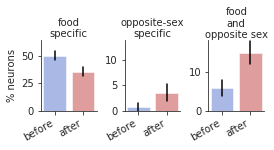

In [344]:
# Figure S5F
p_responsive_df_no_cohort1 = get_percent_responsive(responsive_df.query('sex=="F" and m not in %s'%cohort1))
make_bar_plots(p_responsive_df_no_cohort1,'baseline 1','baseline 2','before','after', 'opposite')
p_responsive_df_no_cohort1 = get_percent_responsive(responsive_df.query('sex=="M" and m not in %s'%cohort1))
make_bar_plots(p_responsive_df_no_cohort1,'baseline 1','baseline 2','before','after', 'opposite')

In [348]:
# Figure S5G
plot_sankey('baseline','sexualExperience','','((s=="male     " and sex=="M") or (s =="female_E " and sex=="F"))')

0.1458138999386308
[0.1301]
0.006570677815060828 0.939256837068621 137


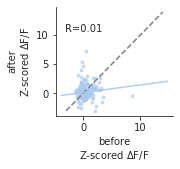

-0.22889510991462078 0.8192942843537933


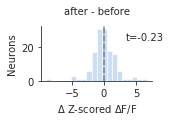

In [368]:
# Figure S5H
cond2title={'baseline':'before',
 'sated': 'stated on week 1',
 'hungry': 'hungry on week 1',
 'sexualExperience': 'after',
 'sexualExperience_hungry': 'hungry on week 2',
 'sexualExperience_sated': 'sated on week 2'}

q='((sex=="F" and s=="female_E ") or (sex=="M" and s=="male     ")) and '
sub_df=first_trial_df.query(q+'condition!="initial" and trial==0 and letter!="-"')
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==6])

rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])

c1='baseline'
c2='sexualExperience'

a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

lm = TheilSenRegressor()

lm.fit(a.reshape(-1,1),b)
print(lm.intercept_)
print(lm.coef_)
f=plt.figure(figsize=(2.1,2.))
plt.scatter(a,b,s=8,c=kcols['blue'],alpha=0.6)
R,p=scipy.stats.pearsonr(a,b)
plt.text(0.4,0.8,'R=%.2f'%R,ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(R,p,len(a))
plt.title('')
sns.despine()
plt.xlabel(cond2title[c1]+'\nZ-scored $\Delta$F/F')
plt.ylabel(cond2title[c2]+'\nZ-scored $\Delta$F/F')
plt.plot([-3,14],[-3,14],color='grey',linestyle='--')
abline(lm.coef_[0], lm.intercept_,kcols['blue'])
plt.show()

f=plt.figure(figsize=(2,1))
plt.hist(b-a,bins=20,alpha=0.6,color=kcols['blue'])
t,p=ttest_1samp(b-a,0)
plt.title('%s - %s'%(cond2title[c2],cond2title[c1]),size=10)
plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(t,p)
plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
plt.ylabel('Neurons')
sns.despine()
plt.axvline(x=np.mean(b-a),color=kcols['blue'],linewidth=2)
plt.axvline(0,linestyle='--',color='grey')
plt.show()

-0.396615253848133 6.279991708453823e-06
-0.24311197960510378 0.013944642378060607
-0.1333882396505081 2.0874156721548314
134 11


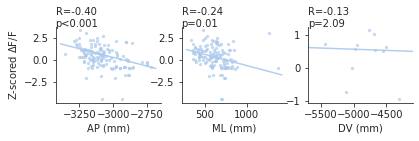

In [354]:
# Figure S5I
sub_ra= response_anatomy.query('condition=="sexualExperience" and stimulus=="male     "')[['mouse','cell','ML','DV','AP','letter','sex']]
ra_diff=pd.merge(sub_ra,diffs_df,left_on=['mouse','letter'],right_on=['m','letter']).query('(sex=="F" and stimulus=="male     ") or (sex=="M" and stimulus=="female_E ")')

fig,axs=plt.subplots(nrows=1,ncols=3,figsize=(6.4,1.4))
for i,lab in enumerate(['AP','ML','DV']):
    a=ra_diff[lab].values
    b=ra_diff['sexualExperience'].values-ra_diff['baseline'].values
    if lab=="ML":
        a=np.abs(a)
        axs[i].scatter(a,b,s=5,c=kcols['blue'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        lm = TheilSenRegressor()
        lm.fit(a.reshape(-1,1),b)
        abline(lm.coef_[0],lm.intercept_,color=kcols['blue'],ax=axs[i])
        R,p=pearsonr(a,b)
    elif lab=="DV":
        b_fov=[]
        a_fov=[]
        for aval in set(a):
            a_fov.append(aval)
            b_fov.append(b[a==aval].mean())
        lm = TheilSenRegressor()
        axs[i].set_xlim(-5700,-4100)
        lm.fit(np.array(a_fov).reshape(-1,1),b_fov)
        abline(lm.coef_[0],lm.intercept_,color=kcols['blue'],ax=axs[i])
        axs[i].scatter(a_fov,b_fov,s=5,c=kcols['blue'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        R,p=pearsonr(a_fov,b_fov)
    else:
        axs[i].scatter(a,b,s=5,c=kcols['blue'],alpha=0.6)
        axs[i].set_xlabel(lab+' (mm)')
        lm = TheilSenRegressor()
        lm.fit(a.reshape(-1,1),b)
        abline(lm.coef_[0],lm.intercept_,color=kcols['blue'],ax=axs[i])
        R,p=pearsonr(a,b)
    print(R,p*3)
    sns.despine()
    xlims=axs[i].get_xlim()
    ylims=axs[i].get_ylim()
    if p*3>0.001:
        axs[i].text(xlims[0],ylims[1],'R=%.2f\np=%.2f'%(R,p*3))
    else:
        axs[i].text(xlims[0],ylims[1],'R=%.2f\np<0.001'%(R))
print(len(a),len(a_fov))
axs[0].set_ylabel('Z-scored $\Delta$F/F')
plt.show()

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:119: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:120: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/jukebox/wang/willmore/anaconda3/envs/suite2p/lib/python3.7/site-packages/ipykernel_launcher.py:121: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_index

initial 55 73 21 137 244
baseline 34 162 26 151 321
sated 39 78 23 232 326
hungry 56 232 52 47 283
sexualExperience 57 156 42 135 306
sexualExperience_hungry 56 252 51 62 319
sexualExperience_sated 39 91 16 225 339


ValueError: not enough values to unpack (expected 2, got 0)

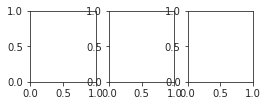

In [355]:
# Figure S5K
p_responsive_df_no_cohort1 = get_percent_responsive(responsive_df.query('m not in %s'%cohort1))
make_bar_plots(p_responsive_df_no_cohort1,'initial','baseline 1','before','after', 'opposite')

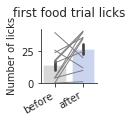

In [371]:
# Figure S5L
lick_df=pd.DataFrame(lick_counts).query('m!="344"').query('cond =="preHabituation" or cond=="baseline"')
c2color={'preHabituation':'grey',
         'baseline':'royalblue',
         'hungry 1': "#7AD4E4",
         'sated 1':"#088096",
         'baseline 2':'tab:red',
         'hungry 2':"#7AD4E4",
         'sated 2':"#088096"}
order=['preHabituation','baseline']
lick_df['licks']=lick_df['licks']*23
col_order=[c2color[c] for c in order]
plt.figure(figsize=(1,1))
sns.barplot(data=lick_df,x='cond',y='licks',ci=68,order=order,alpha=0.3,palette=col_order)

for m,dat in lick_df.sort_values(['m','cond']).groupby('m'):
    plt.plot([1,0],dat.licks.values,color='grey',linewidth=1)
sns.despine()
plt.xlabel('')
plt.ylabel('Number of licks')
plt.xticks([0,1],['before','after'],rotation=30,ha='right')
plt.title('first food trial licks')
plt.show()

In [372]:
# Figure S5M
plot_sankey('initial','baseline','','((s=="male     " and sex=="F") or (s =="female_E " and sex=="M"))')

-0.24521523464824002
[0.2452]
0.37233254166207586 8.454609859257517e-07 165


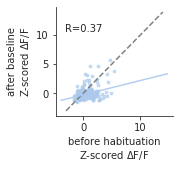

-4.962549096459456 1.7285780501800816e-06


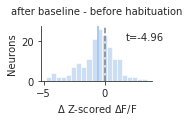

In [367]:
# Figure S5N

cond2title={'initial':'before habituation','baseline':'after baseline'}

q='((sex=="M" and s=="female_E ") or (sex=="F" and s=="male     ")) and '
sub_df=first_trial_df.query(q+'(condition=="initial" or condition=="baseline") and trial==0 and letter!="-"')
cells_in_all=set([C for C,count in dict(Counter([(m,l) for (m,l) in zip(sub_df.m.values,
                     sub_df.letter.values)])).items() if count==2])

rows_in_all=[]
for r in sub_df.iterrows():
    if (r[1]['m'],r[1]['letter']) in cells_in_all:
        rows_in_all.append(r[0])
sub_df_in_all=sub_df.loc[rows_in_all].sort_values(['m','letter'])

c1='initial'
c2='baseline'

a=sub_df_in_all.query('condition=="%s"'%c1).first_sec.values
b=sub_df_in_all.query('condition=="%s"'%c2).first_sec.values

lm = TheilSenRegressor()

lm.fit(a.reshape(-1,1),b)
print(lm.intercept_)
print(lm.coef_)
f=plt.figure(figsize=(2.1,2.))
plt.scatter(a,b,s=8,c=kcols['blue'],alpha=0.6)
R,p=scipy.stats.pearsonr(a,b)
plt.text(0.4,0.8,'R=%.2f'%R,ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(R,p,len(a))
plt.title('')
sns.despine()
plt.xlabel(cond2title[c1]+'\nZ-scored $\Delta$F/F')
plt.ylabel(cond2title[c2]+'\nZ-scored $\Delta$F/F')
plt.plot([-3,14],[-3,14],color='grey',linestyle='--')
abline(lm.coef_[0], lm.intercept_,kcols['blue'])
plt.show()

f=plt.figure(figsize=(2,1))
plt.hist(b-a,bins=20,alpha=0.6,color=kcols['blue'])
t,p=ttest_1samp(b-a,0)
plt.title('%s - %s'%(cond2title[c2],cond2title[c1]),size=10)
plt.text(1.1,0.8,'t=%.2f'%(t),ha='right',
         horizontalalignment='center',
         verticalalignment='center',
         transform = f.axes[0].transAxes)
print(t,p)
plt.xlabel('$\Delta$ Z-scored $\Delta$F/F')
plt.ylabel('Neurons')
sns.despine()
plt.axvline(x=np.mean(b-a),color=kcols['blue'],linewidth=2)
plt.axvline(0,linestyle='--',color='grey')
plt.show()